In [2]:
### IMPORT SCIENTIFIC LIBRARIES ###
import numpy as np
import pandas as pd
from scipy import sparse
from scipy.optimize import curve_fit
import importlib

import matplotlib.pyplot as plt
#import seaborn as sns
plt.rcParams['font.size'], plt.rcParams['axes.labelsize'] = 14, 18
#%matplotlib widget

from tqdm import tqdm
import io, sys
from contextlib import redirect_stdout, redirect_stderr

import os

import h5py
import hdf5plugin

import sys
sys.path.append('./XPCS_library/')

import ID10_tools as ID10
from ID10_tools import Nx, Ny, Npx
importlib.reload(ID10)
ID10.set_version('v2')

import XPCS_tools as XPCS
from XPCS_tools import E2lambda, lambda2E, theta2Q, Q2theta, decorelation_f
importlib.reload(XPCS)
XPCS.set_beamline('ID10')

import COSMICRAY_tools as COSMIC
importlib.reload(COSMIC)
COSMIC.set_beamline('ID10')

# RAW FOLDER PATH
raw_folder = '../RAW_DATA/'
masks_folder = '../masks/'
fit_outs_folder = './data/fit_outs/'
Idts_folder = './data/Idts/'
g2_folder = './data/g2/'

# EXPERIMENTAL VARIABLES
XPCS.set_expvar(1350, 1350, 7)
ID10.Nfmax_dense_file = 2000
ID10.Nfmax_sparse_file = 5000

## Load masks

In [3]:
e4m_htmask = np.load(masks_folder+'e4m_htmask_copper_foil_30um_1_1'+'.npy')
e4m_mask = np.load(masks_folder+'e4m_mask'+'.npy')
#bs_mask = np.load(masks_folder+'bs_mask_copper_foil_30um'+'.npy')  # beam-stop mask

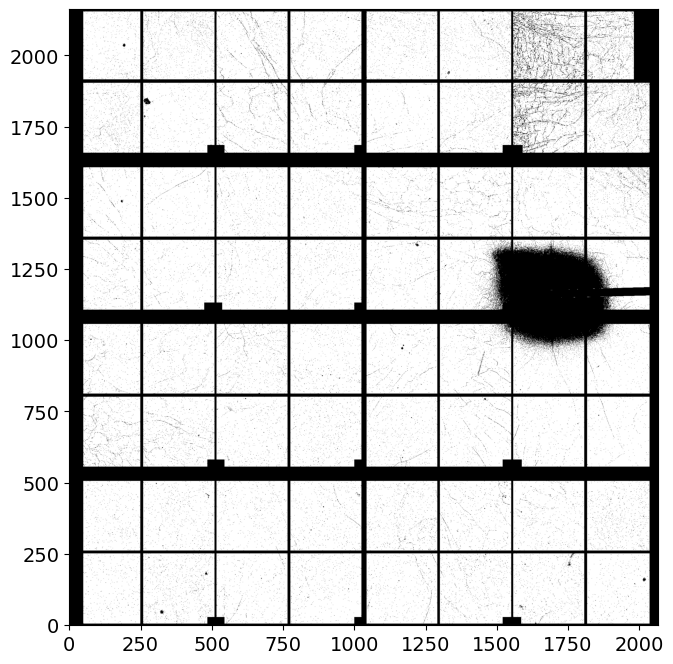

In [4]:
plt.figure(figsize=(8, 8))
plt.imshow((e4m_mask*e4m_htmask).reshape(Nx,Ny), cmap='gray', origin='lower')

### BS mask and Q definition
Using a random scan in GeO2_6, because we are not changing the measurement configuration

#### Beamstop mask

In [5]:
#######################################
sample_name = 'GeO2_6'
Ndataset = 1
Nscan =12
Nfi, Nff = 0, 1000
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

#############################
command = mtimescan 0.02 1 220000
Ei = 9.699998837562536
itime = 0.0201
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/1 loops)
Done!
Concatenating vectors ...
Done!
	 | Sparse array loaded from ../RAW_DATA/GeO2_6/GeO2_6_0001/scan0012/
	 | Shape:       (1000, 4471016)
	 | Sparsity:     3.8e-03
	 | Memory usage (scipy.csr_array): 0.192 GB (np.array usage: 16.656 GB)


################################################################################
Maximum count in the hull run -> 4689
# of pixels above Ith_high treshold ->  75 pixels (of 4471016 => 0.0 %)
################################################################################



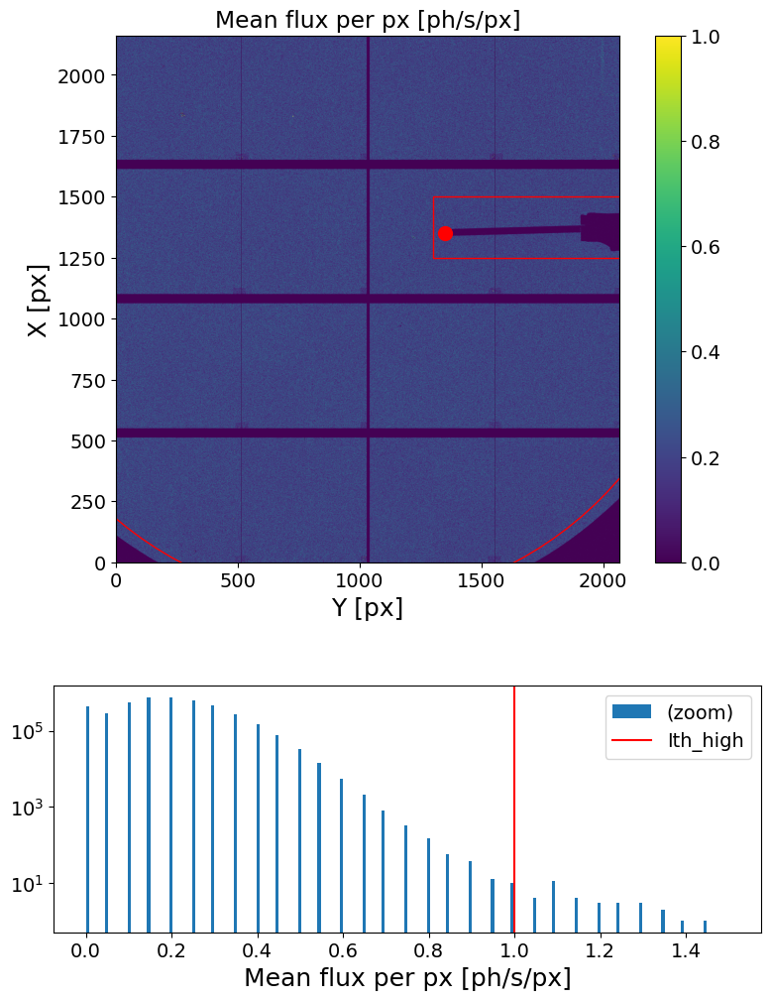

In [6]:
geom = [{'geom':'Rectangle', 'x0':1250, 'y0':1300, 'xl':250, 'yl':1950, 'inside':False},
        {'geom':'Circle', 'Cx':1300, 'Cy':950, 'r':1470, 'inside':True}, 
        ]
XPCS.gen_plots4mask(e4m_data, itime, Ith_high=1, Nff=10000, mask_geom=geom,)

#################################################
Masked area =  93.74594052000708 %
#################################################



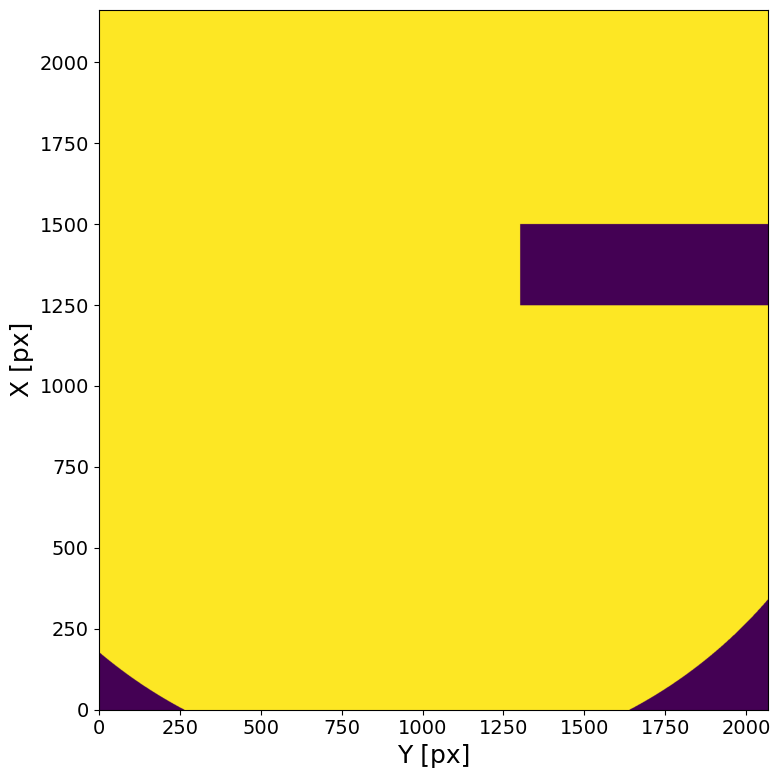

In [7]:
bs_mask = XPCS.gen_mask(e4m_data, itime, e4m_mask=None, mask_geom=geom)

#### Q mask

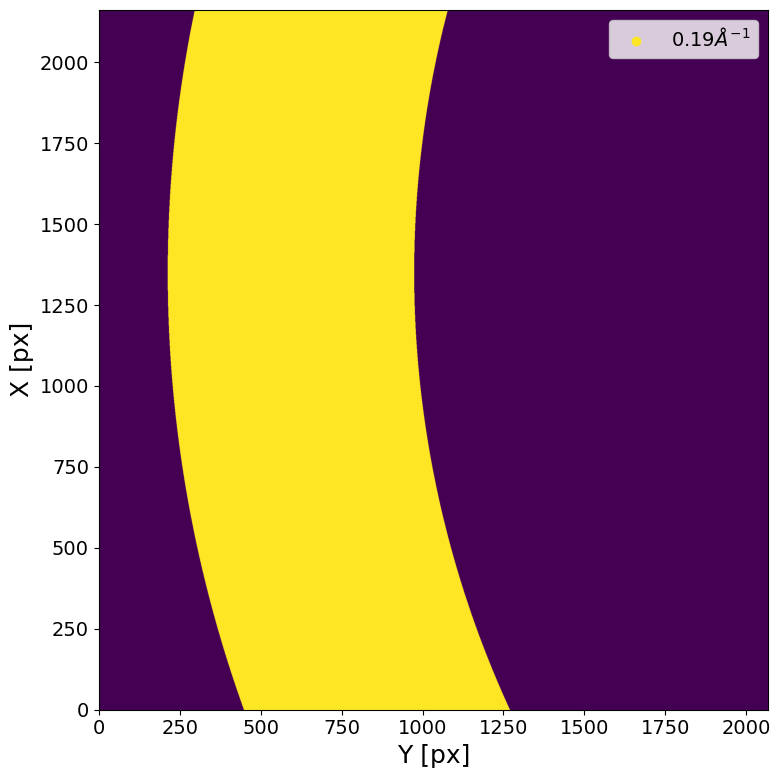

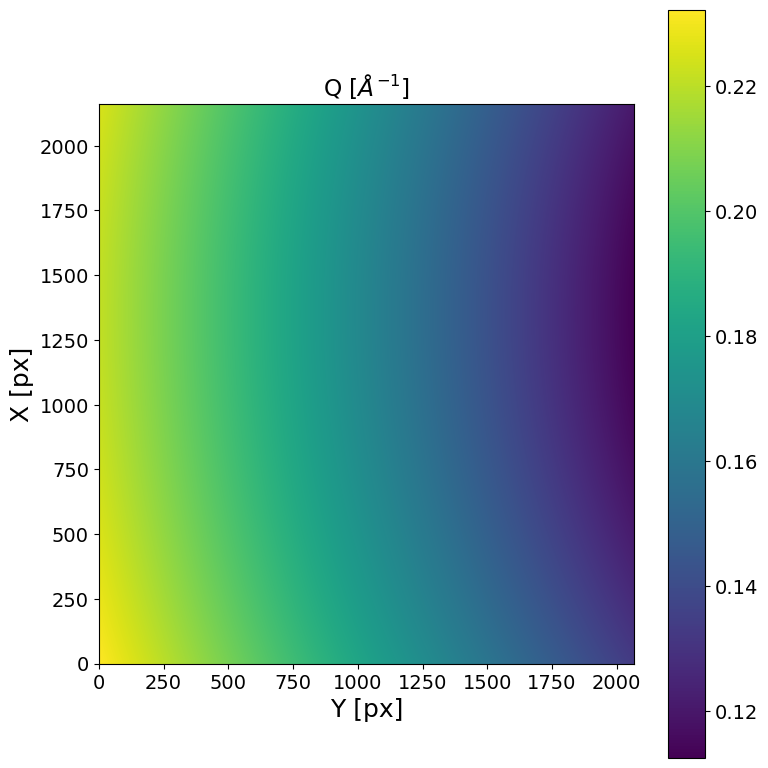

In [8]:
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=True)

## XPCS scan (Ei =  9.7 keV, T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_30C, dataset 2, scan 3)

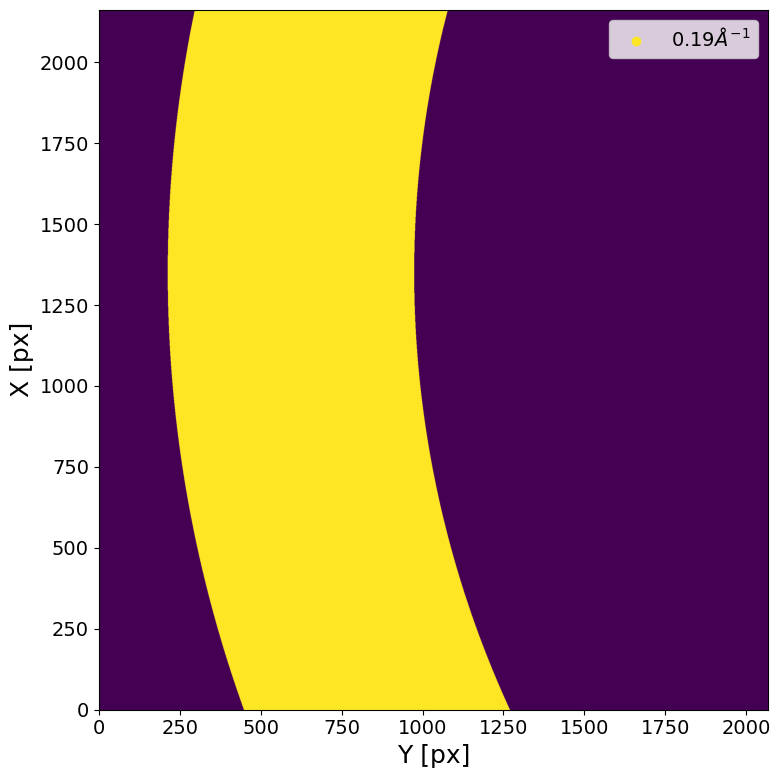

#############################
command = mtimescan 0.001 1 1200192
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/241 loop

In [27]:
#######################################
sample_name = 'GeO2_4_30C'
Ndataset = 2
Nscan = 4
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  135 pixels (of 4471016 => 0.0 %)
################################################################################



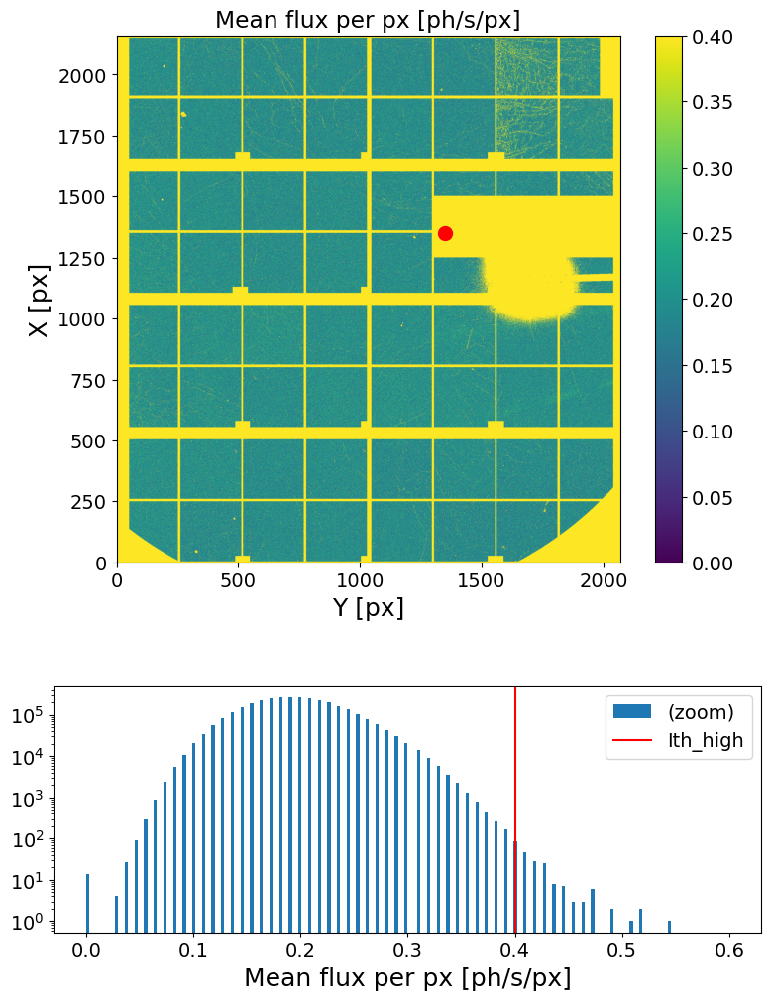

In [28]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [29]:
####################
Lbin = 1
Nstep = 100
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

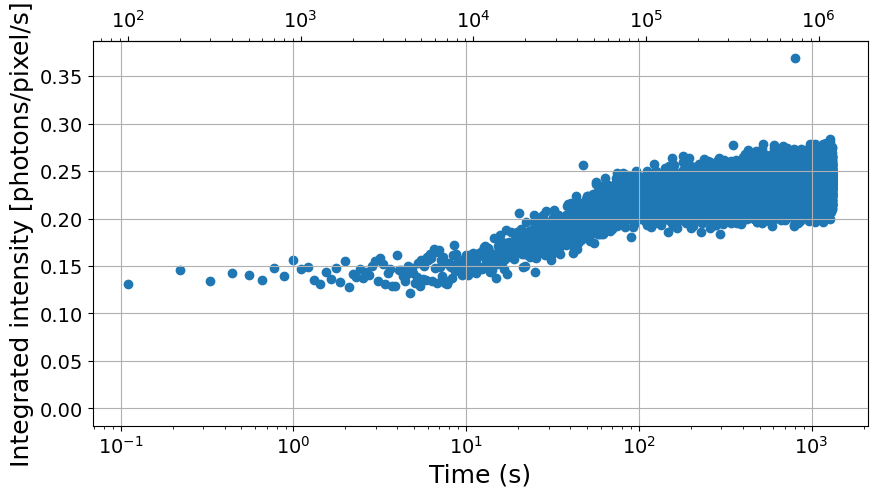

In [30]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [31]:
###################
Nfi = 100_000
Nff = None
Lbin = 10
Nbunch = 5
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 100000 , Nff = 320038 ) ...
Loading frames ...
Done! (elapsed time = 2.68 s)
Binning frames (Lbin = 10, using MKL library) ...
Done! (elapsed time = 7.56 s)
	 | 22003 frames X 4471016 pixels
	 | sparsity = 2.29e-03
	 | memory usage (sparse.csr_array @ float64) = 2.513 GB
Masking data ...
Done! (elapsed time = 4.56 s)
	 | 22003 frames X 1427140 pixels
	 | sparsity = 2.48e-03
	 | memory usage (sparse.csr_array @ float64) = 0.872 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 5.8 s)
	 | 22003 X 22003 squared matrix
	 | memory usage (np.array @ float64) = 3.607 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 1.45 s)

Done!

Computing G2t for bunch 2 (Nfi = 320038 , Nff = 540076 ) ...
Loading frames ...
Done! (elapsed time = 3.19 s)
Binning frames (Lbin = 10, using MKL library) ...
Done! (elapsed time = 8.75 s)
	 | 22003 frames X 4471016 pixels
	 | sparsity = 2.34e-03
	 | memory usage (sparse.csr_array @ float64) = 2.571 GB

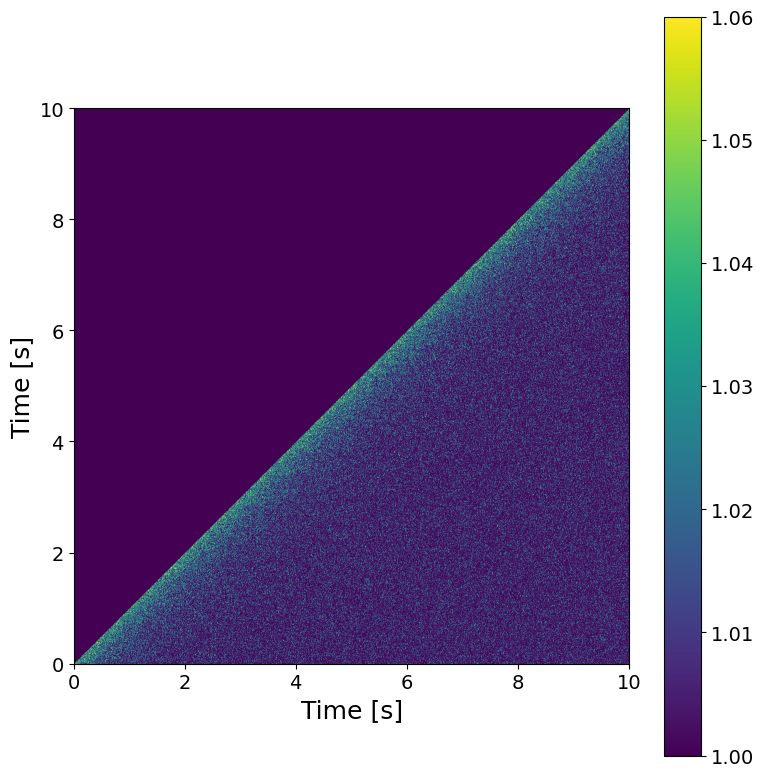

In [32]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [33]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 0.43 s)



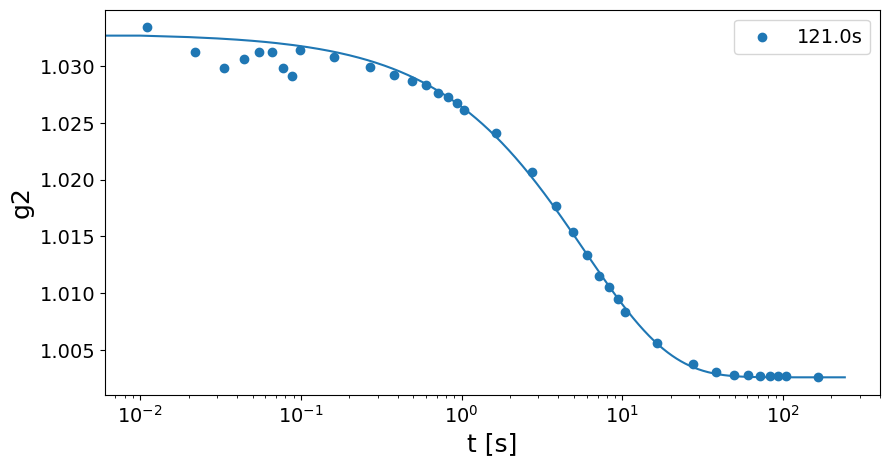

tau = 5.821469472023558 +/- 0.16766515315099384
beta = 0.8112653889379541 +/- 0.01931245094566382
c = 0.0303061861066535 +/- 0.0005323356978321457
y0 = 1.0025796050358575 +/- 2.333884524102194e-05


In [34]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-2)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 9.7 keV, T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_30C, dataset 2, scan 5, attenuatore 0.5)

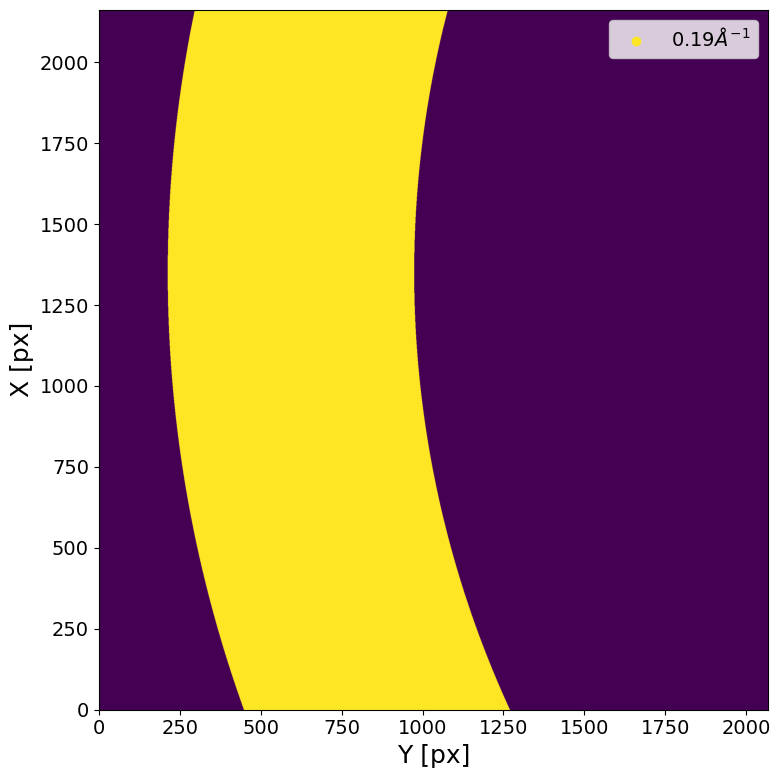

#############################
command = mtimescan 0.001 1 2400384
Ei = 9.699998837562536
itime = 0.0011
theta = 1.7500000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/481 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/481 loop

In [35]:
#######################################
sample_name = 'GeO2_4_30C'
Ndataset = 2
Nscan = 5
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  1 pixels (of 4471016 => 0.0 %)
################################################################################



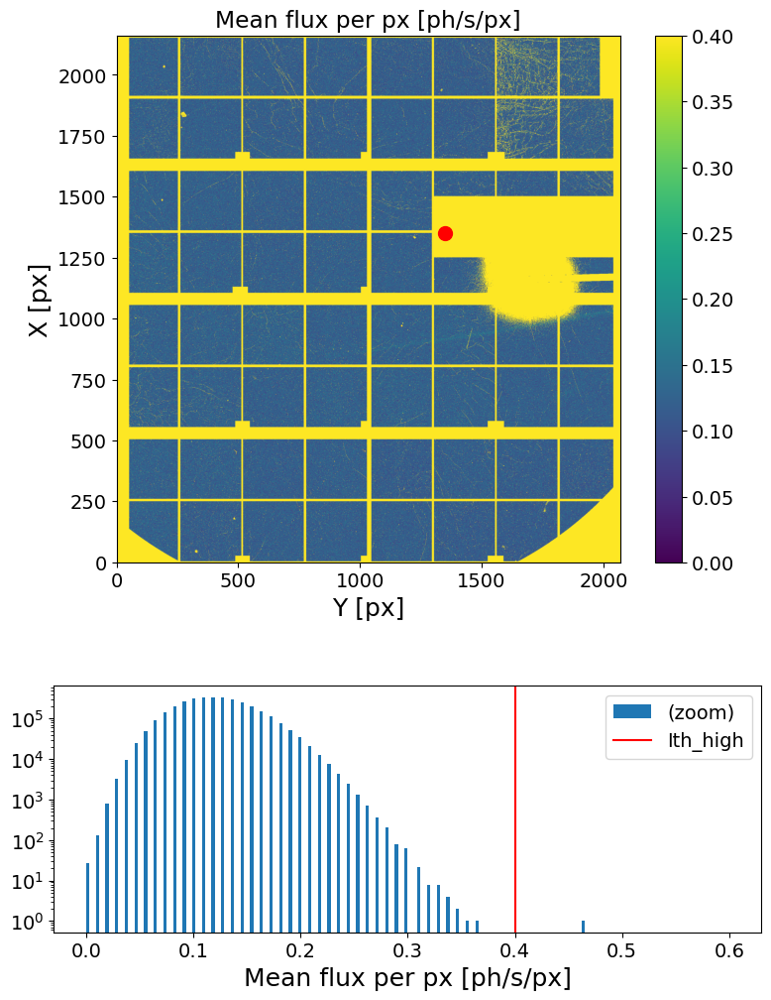

In [36]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [37]:
####################
Lbin = 1
Nstep = 100
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

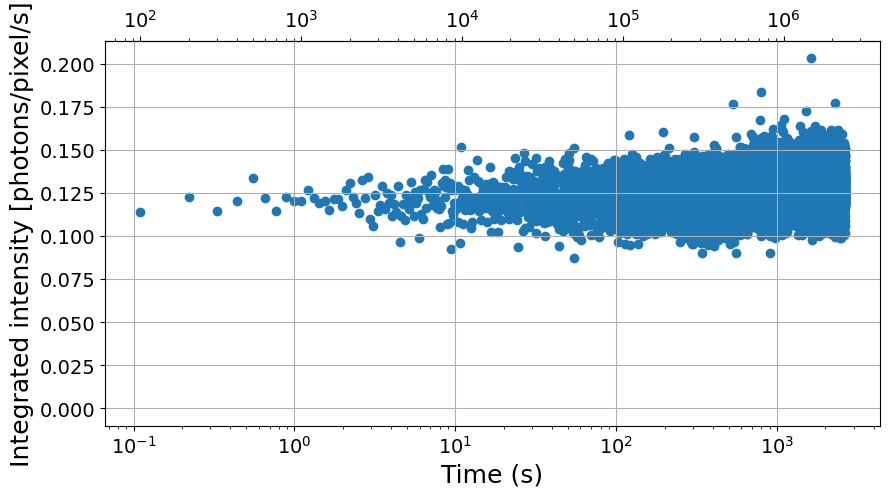

In [38]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [39]:
###################
Nfi = 100_000
Nff = None
Lbin = 10
Nbunch = 5
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 100000 , Nff = 560076 ) ...
Loading frames ...
Done! (elapsed time = 3.44 s)
Binning frames (Lbin = 10, using MKL library) ...
Done! (elapsed time = 6.31 s)
	 | 46007 frames X 4471016 pixels
	 | sparsity = 1.24e-03
	 | memory usage (sparse.csr_array @ float64) = 2.857 GB
Masking data ...
Done! (elapsed time = 2.71 s)
	 | 46007 frames X 1427140 pixels
	 | sparsity = 1.35e-03
	 | memory usage (sparse.csr_array @ float64) = 0.992 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 9.23 s)
	 | 46007 X 46007 squared matrix
	 | memory usage (np.array @ float64) = 15.77 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 6.78 s)

Done!

Computing G2t for bunch 2 (Nfi = 560076 , Nff = 1020152 ) ...
Loading frames ...
Done! (elapsed time = 5.77 s)
Binning frames (Lbin = 10, using MKL library) ...
Done! (elapsed time = 10.22 s)
	 | 46007 frames X 4471016 pixels
	 | sparsity = 1.29e-03
	 | memory usage (sparse.csr_array @ float64) = 2.974

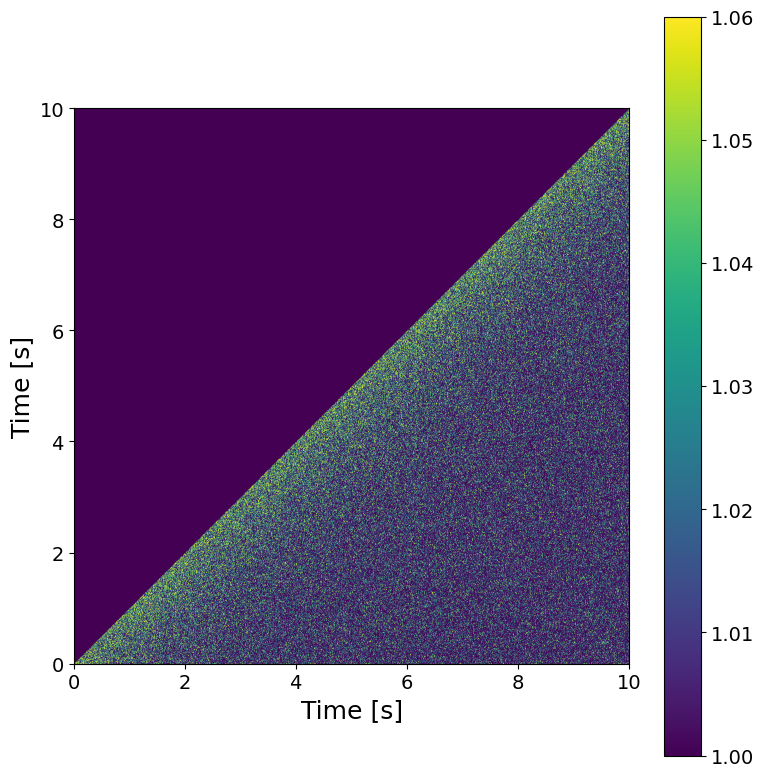

In [40]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [41]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 2.05 s)



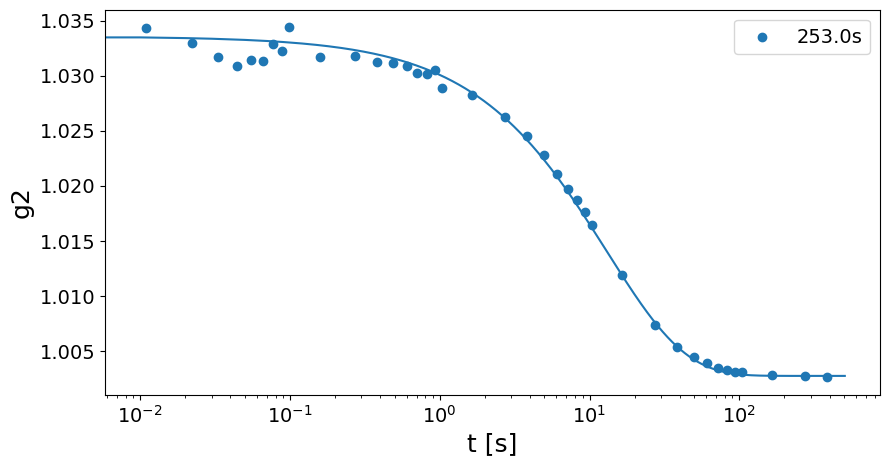

tau = 12.991485916872424 +/- 0.3253422574129036
beta = 0.826376352805085 +/- 0.017611320787208243
c = 0.03084627898698674 +/- 0.0004771182400747778
y0 = 1.0027236806142286 +/- 2.20313075118734e-05


In [42]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-2)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 10.25 keV, T = 30C Q =  0.19 Å, 50 min @ 1ms (3_000_000 fm)) (GeO2_4_10p25, dataset 1, scan 14)

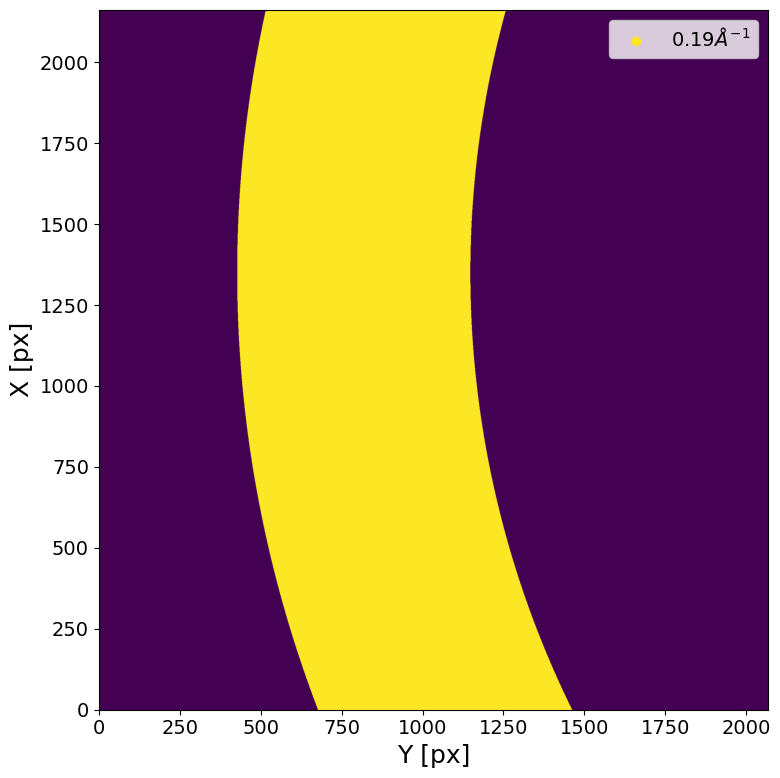

#############################
command = mtimescan 0.001 1 3599664
Ei = 10.25000164635837
itime = 0.0011
theta = 1.7500000000000004
Q = 0.16
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/624 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/624 loop

KeyboardInterrupt: 

In [43]:
#######################################
sample_name = 'GeO2_4_10p25'
Ndataset = 1
Nscan = 14
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  2494 pixels (of 4471016 => 0.07 %)
################################################################################



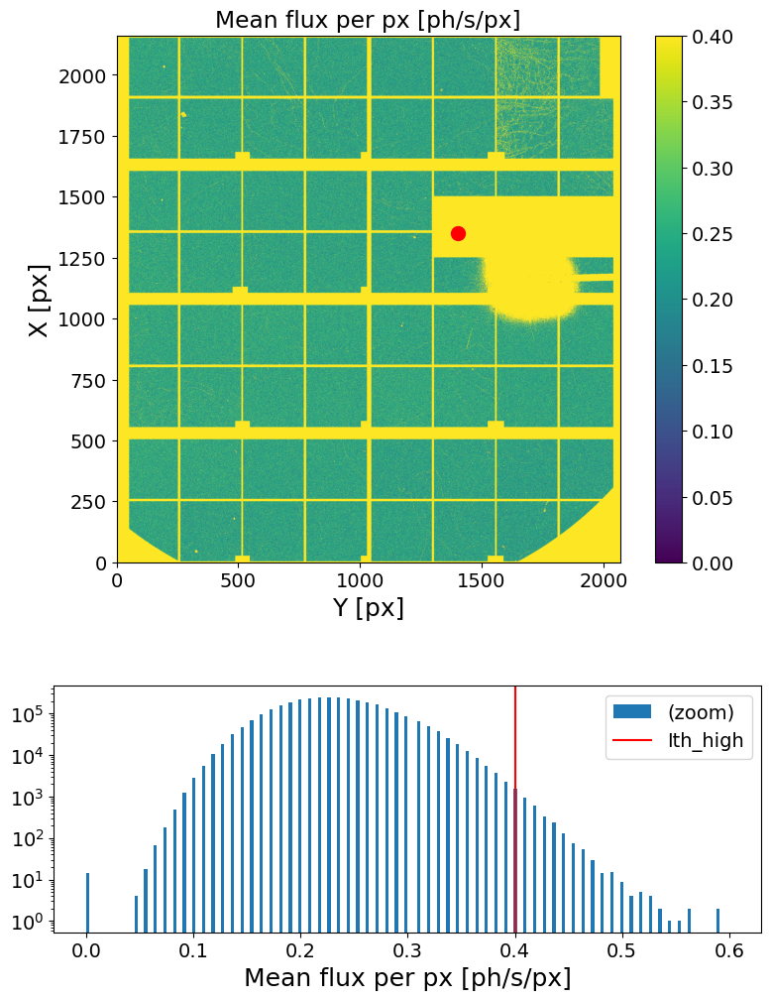

In [ ]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [ ]:
####################
Lbin = 1
Nstep = 1000
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

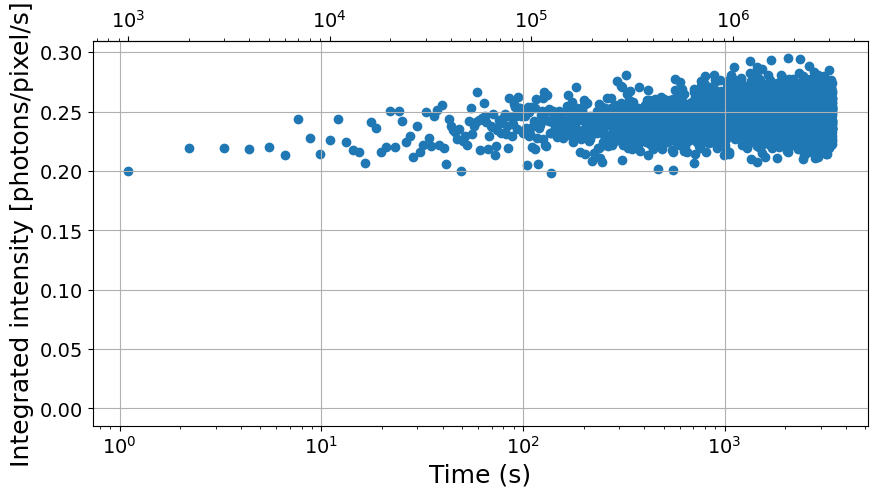

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [ ]:
###################
Nfi = None
Nff = None
Lbin = 2
Nbunch = 100
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 0 , Nff = 62326 ) ...
Loading frames ...
Done! (elapsed time = 0.79 s)
	 | 62326 frames X 4471016 pixels
	 | sparsity = 2.32e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.542 GB
Masking data ...
Done! (elapsed time = 1.42 s)
	 | 62326 frames X 1424709 pixels
	 | sparsity = 2.52e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.188 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 9.37 s)
	 | 62326 X 62326 squared matrix
	 | memory usage (np.array @ float64) = 28.942 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 12.49 s)

Done!

Computing G2t for bunch 2 (Nfi = 62326 , Nff = 124652 ) ...
Loading frames ...
Done! (elapsed time = 0.41 s)
	 | 62326 frames X 4471016 pixels
	 | sparsity = 2.41e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.564 GB
Masking data ...
Done! (elapsed time = 1.66 s)
	 | 62326 frames X 1424709 pixels
	 | sparsity = 2.62e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.196 GB
Computing

KeyboardInterrupt: 

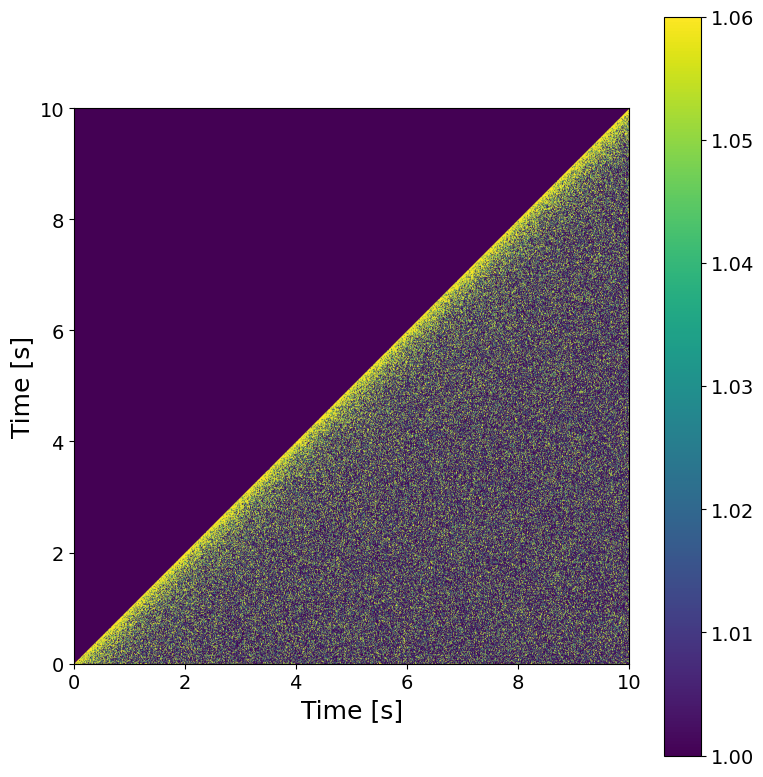

In [ ]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [ ]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 1.79 s)



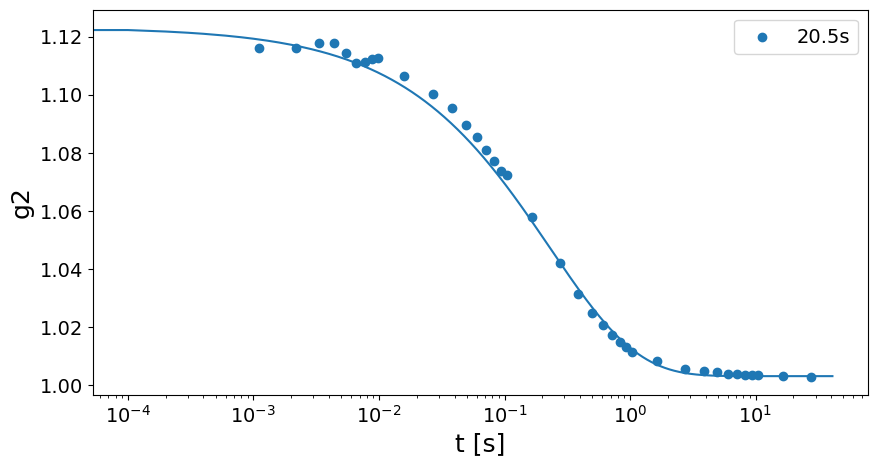

tau = 0.2299969741672385 +/- 0.010283896937404769
beta = 0.6260230763061072 +/- 0.015297183932521625
c = 0.11999999999999998 +/- 0.0027195565783599807
y0 = 1.0031999109599095 +/- 4.5141098019705e-05


In [ ]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 10.25 keV, T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_10p25, dataset 1, scan 15, fresh point)

In [ ]:
#######################################
sample_name = 'GeO2_4_10p25'
Ndataset = 1
Nscan = 15
Nfi, Nff =  None, 200000
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 10.25000164635837
itime = 0.0011
theta = 1.7500000000000004
Q = 0.16
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/41 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/41 loops)
	 -> load

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  1231 pixels (of 4471016 => 0.04 %)
################################################################################



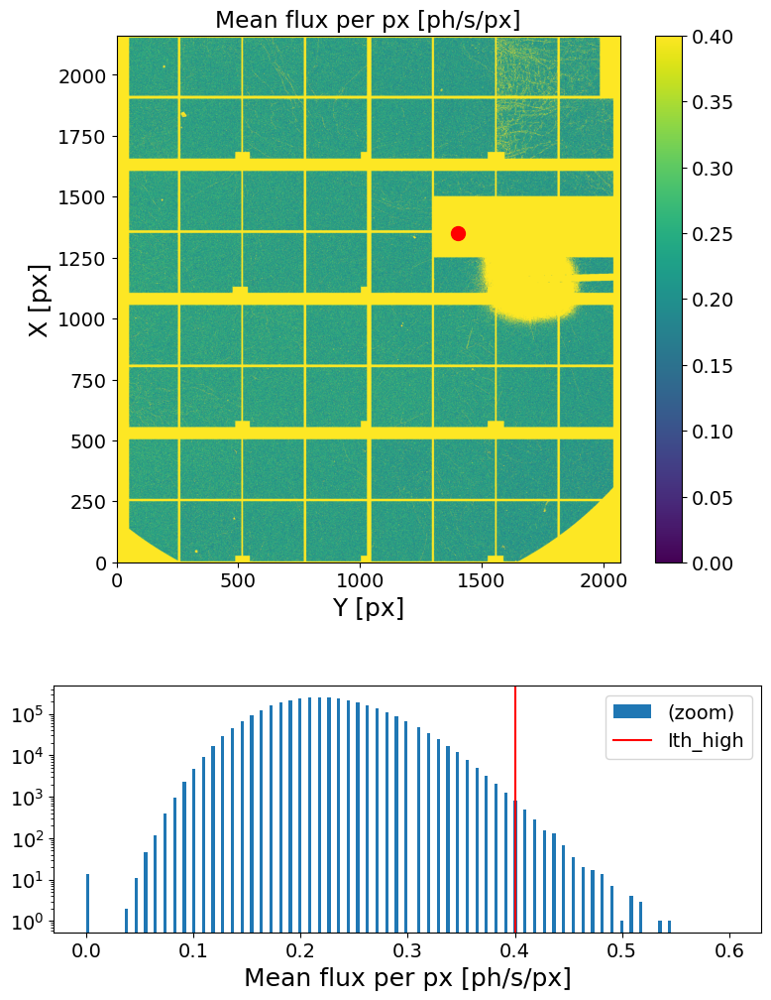

In [ ]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [ ]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

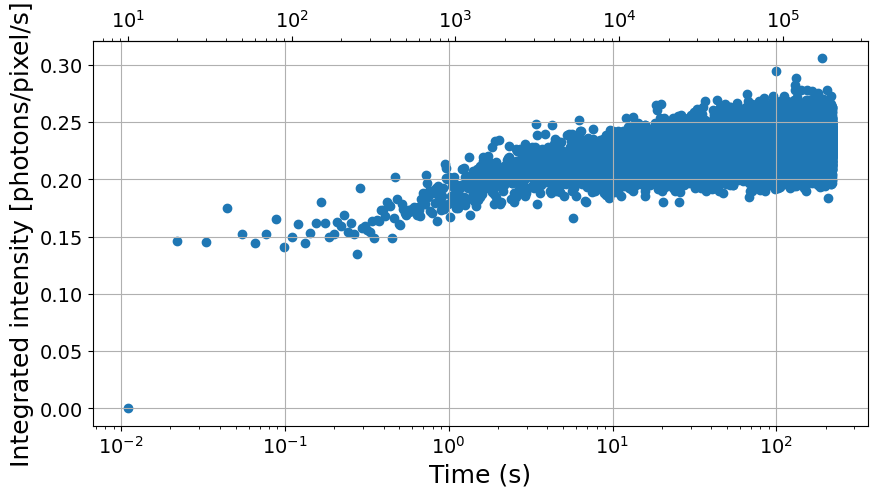

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [ ]:
###################
Nfi = None
Nff = None
Lbin = 1
Nbunch = 50
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 0 , Nff = 8400 ) ...
Loading frames ...
Done! (elapsed time = 0.1 s)
	 | 8400 frames X 4471016 pixels
	 | sparsity = 2.06e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.065 GB
Masking data ...
Done! (elapsed time = 0.36 s)
	 | 8400 frames X 1424709 pixels
	 | sparsity = 2.25e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.023 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 0.16 s)
	 | 8400 X 8400 squared matrix
	 | memory usage (np.array @ float64) = 0.526 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.03 s)

Done!

Computing G2t for bunch 2 (Nfi = 8400 , Nff = 16800 ) ...
Loading frames ...
Done! (elapsed time = 0.11 s)
	 | 8400 frames X 4471016 pixels
	 | sparsity = 2.20e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.069 GB
Masking data ...
Done! (elapsed time = 0.4 s)
	 | 8400 frames X 1424709 pixels
	 | sparsity = 2.40e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.024 GB
Computing G2t (using M

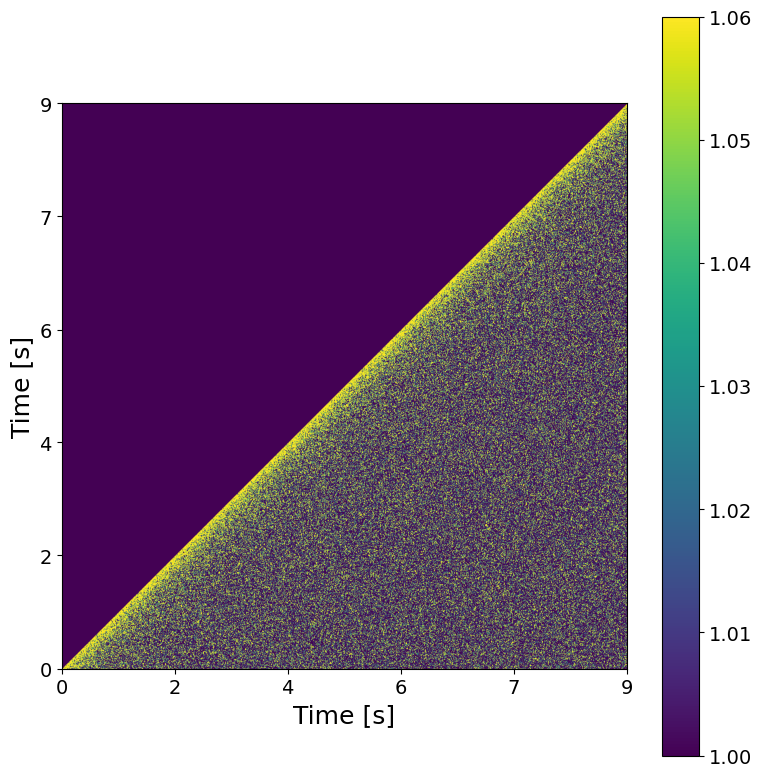

In [ ]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [ ]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 0.12 s)



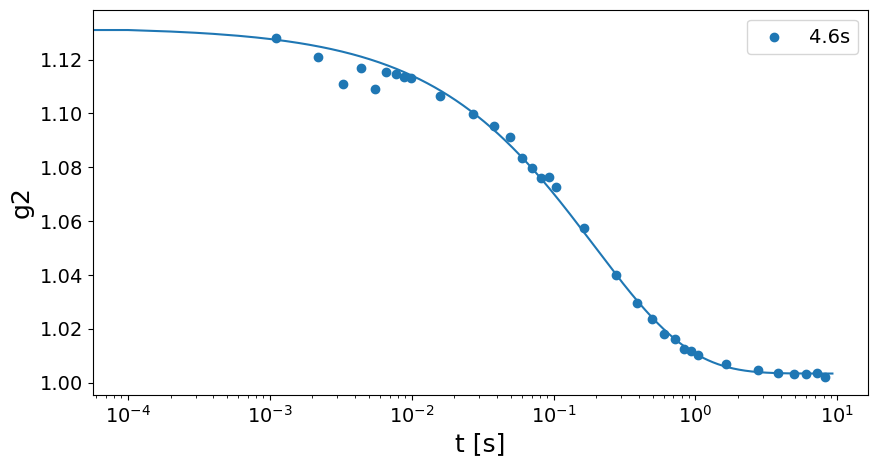

tau = 0.19416874198904283 +/- 0.014294535764219993
beta = 0.6402316931443935 +/- 0.027708796985226714
c = 0.1285937023158856 +/- 0.004946315238563381
y0 = 1.0033781346385002 +/- 0.00018049379481741267


In [ ]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 10.25 keV, T = 30C, Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_10p25, dataset 1, scan 16, fresh point, theta 2.4)

In [ ]:
#######################################
sample_name = 'GeO2_4_10p25'
Ndataset = 1
Nscan = 16
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

#############################
command = mtimescan 0.001 1 3599664
Ei = 10.25000164635837
itime = 0.0011
theta = 1.7500000000000004
Q = 0.16
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/145 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/145 loop

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  2504 pixels (of 4471016 => 0.08 %)
################################################################################



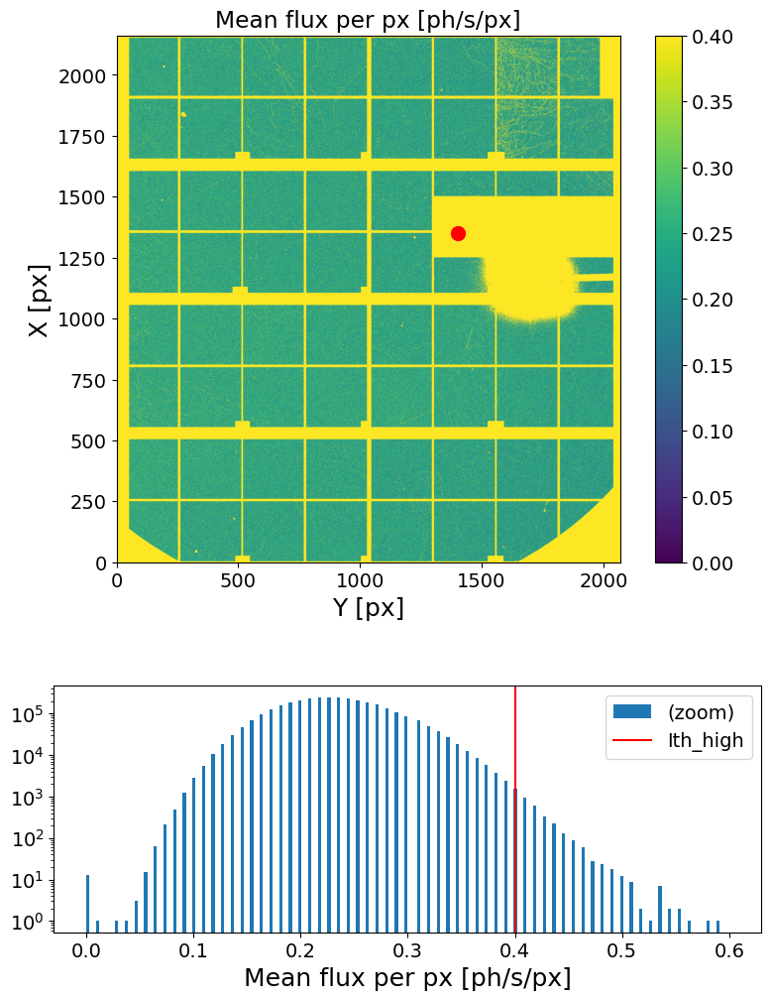

In [ ]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [ ]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

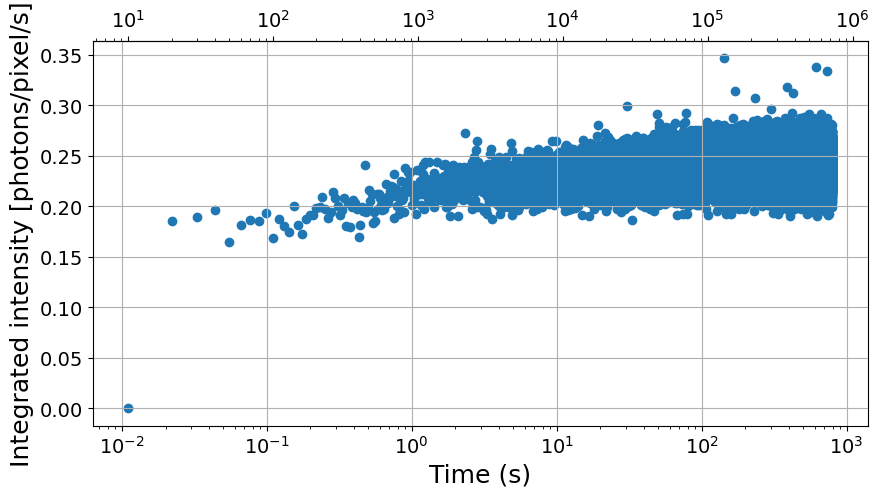

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [ ]:
###################
Nfi = None
Nff = None
Lbin = 1
Nbunch = 20
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 0 , Nff = 15000 ) ...
Loading frames ...
Done! (elapsed time = 0.17 s)
	 | 15000 frames X 4471016 pixels
	 | sparsity = 2.26e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.127 GB
Masking data ...
Done! (elapsed time = 0.5 s)
	 | 15000 frames X 1424709 pixels
	 | sparsity = 2.47e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.044 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 1.18 s)
	 | 15000 X 15000 squared matrix
	 | memory usage (np.array @ float64) = 1.676 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 0.82 s)

Done!

Computing G2t for bunch 2 (Nfi = 15000 , Nff = 30000 ) ...
Loading frames ...
Done! (elapsed time = 0.12 s)
	 | 15000 frames X 4471016 pixels
	 | sparsity = 2.33e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.131 GB
Masking data ...
Done! (elapsed time = 0.59 s)
	 | 15000 frames X 1424709 pixels
	 | sparsity = 2.55e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.046 GB
Computing G2t

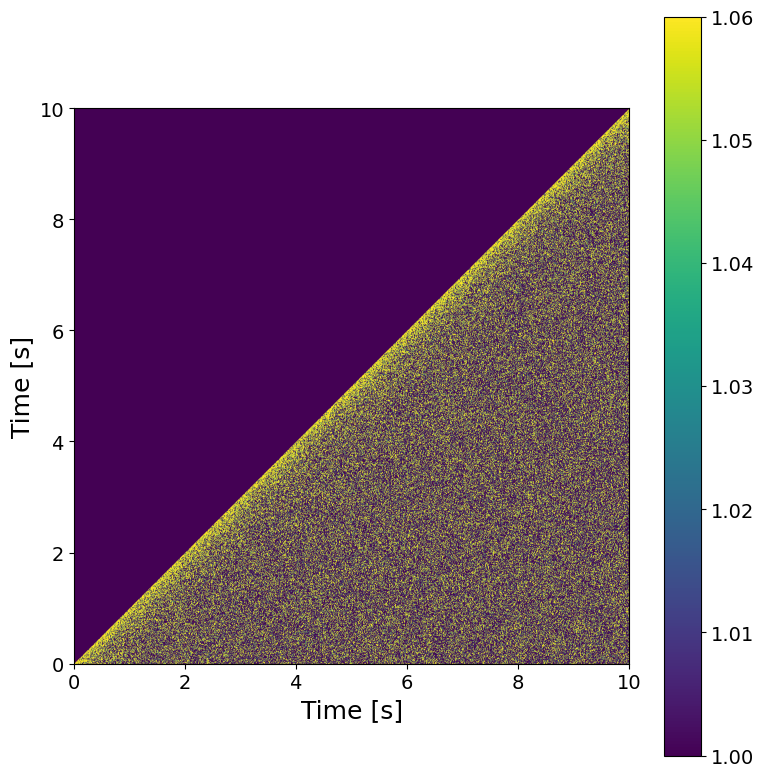

In [ ]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [ ]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 0.33 s)



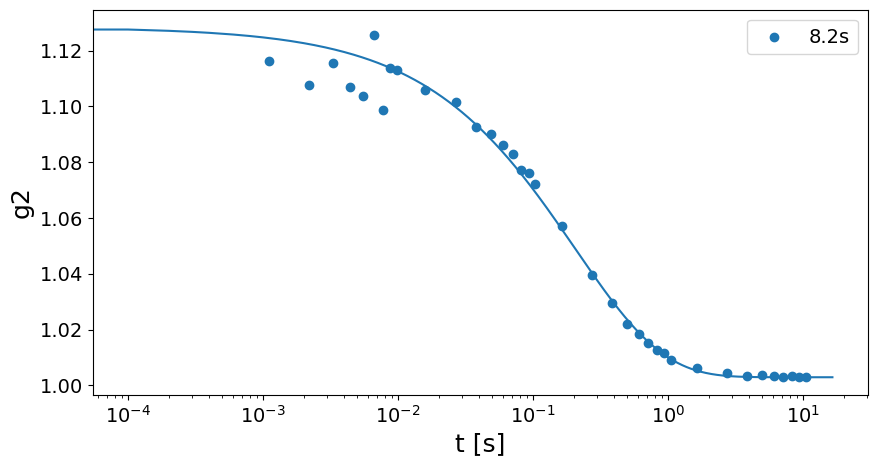

tau = 0.20498260461986292 +/- 0.01806797430510486
beta = 0.6641468452413436 +/- 0.035427643338461906
c = 0.1254011386742638 +/- 0.00586229359322494
y0 = 1.002906330280666 +/- 0.00015593198977512717


In [ ]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 10.25 keV, T = 30C, Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_10p25, dataset 1, scan 17, fresh point, theta 0)

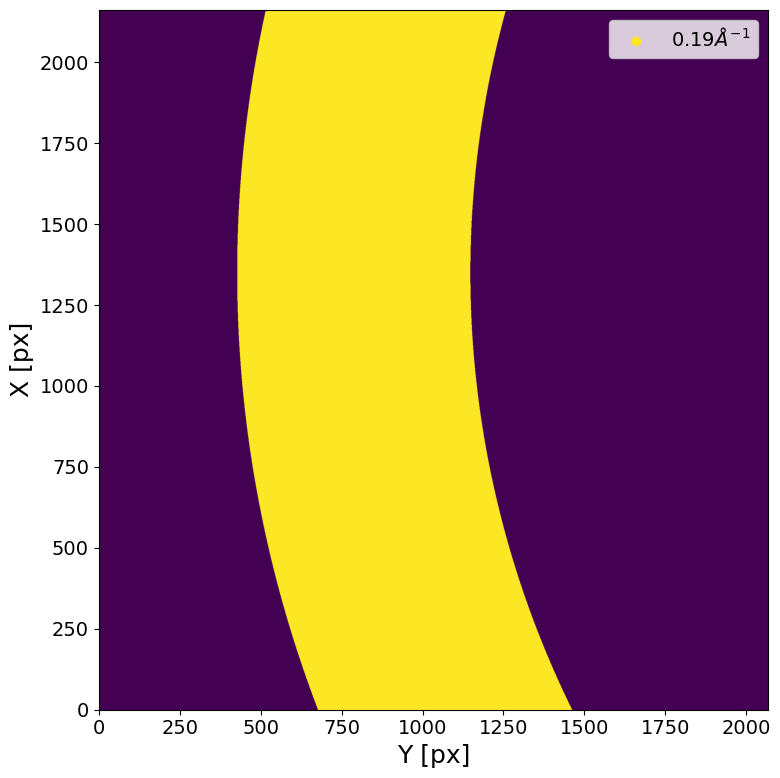

#############################
command = mtimescan 0.001 1 3599664
Ei = 10.25000164635837
itime = 0.0011
theta = 1.7500000000000004
Q = 0.16
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/259 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/259 loop

KeyboardInterrupt: 

In [44]:
#######################################
sample_name = 'GeO2_4_10p25'
Ndataset = 1
Nscan = 17
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  1186 pixels (of 4471016 => 0.04 %)
################################################################################



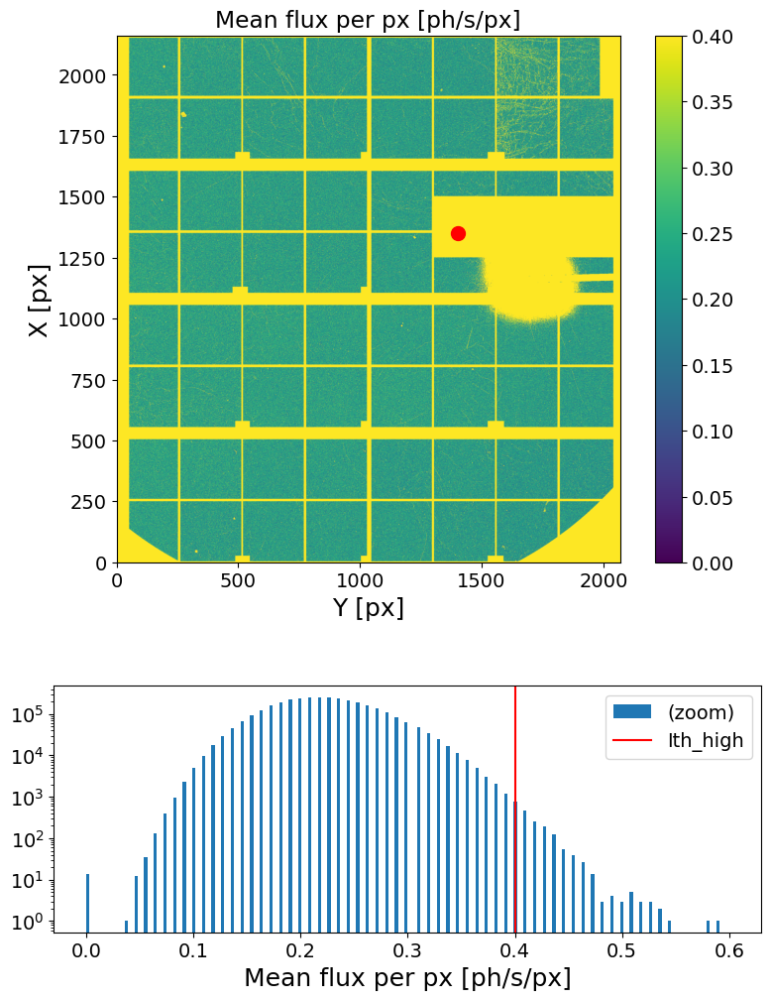

In [ ]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [ ]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

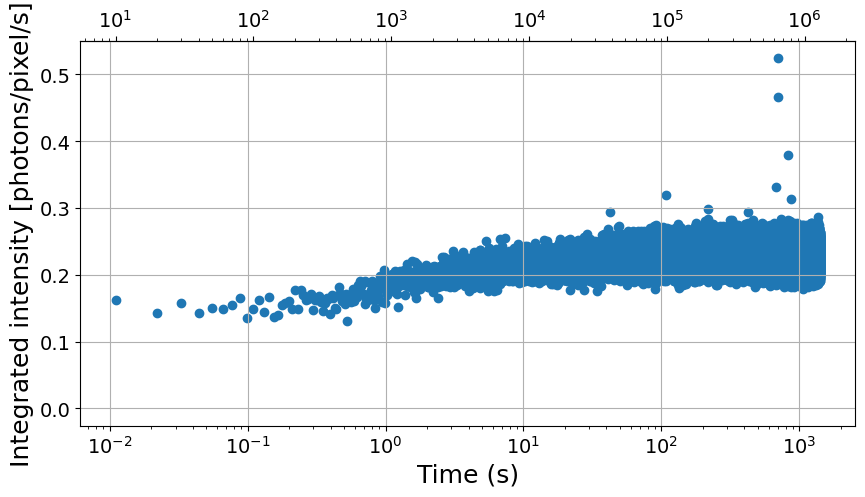

In [ ]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [ ]:
###################
Nfi = None
Nff = None
Lbin = 1
Nbunch = 20
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 0 , Nff = 64508 ) ...
Loading frames ...
Done! (elapsed time = 0.43 s)
	 | 64508 frames X 4471016 pixels
	 | sparsity = 2.23e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.538 GB
Masking data ...
Done! (elapsed time = 1.25 s)
	 | 64508 frames X 1344238 pixels
	 | sparsity = 2.42e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.176 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 10.3 s)
	 | 64508 X 64508 squared matrix
	 | memory usage (np.array @ float64) = 31.004 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 11.28 s)

Done!

Computing G2t for bunch 2 (Nfi = 64508 , Nff = 129016 ) ...
Loading frames ...
Done! (elapsed time = 0.45 s)
	 | 64508 frames X 4471016 pixels
	 | sparsity = 2.31e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.559 GB
Masking data ...
Done! (elapsed time = 1.32 s)
	 | 64508 frames X 1344238 pixels
	 | sparsity = 2.51e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.183 GB
Computing

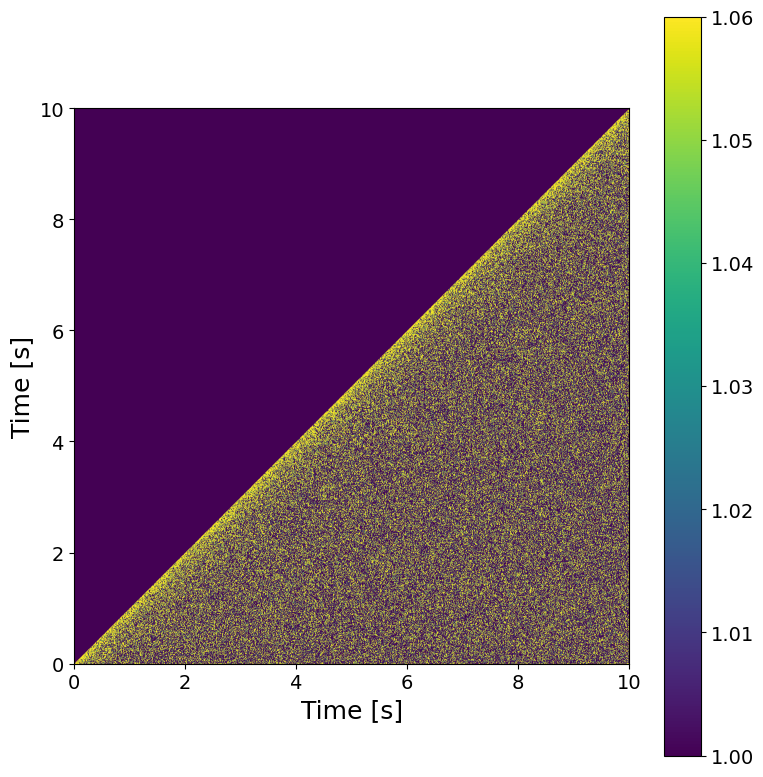

In [ ]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [ ]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 6.91 s)



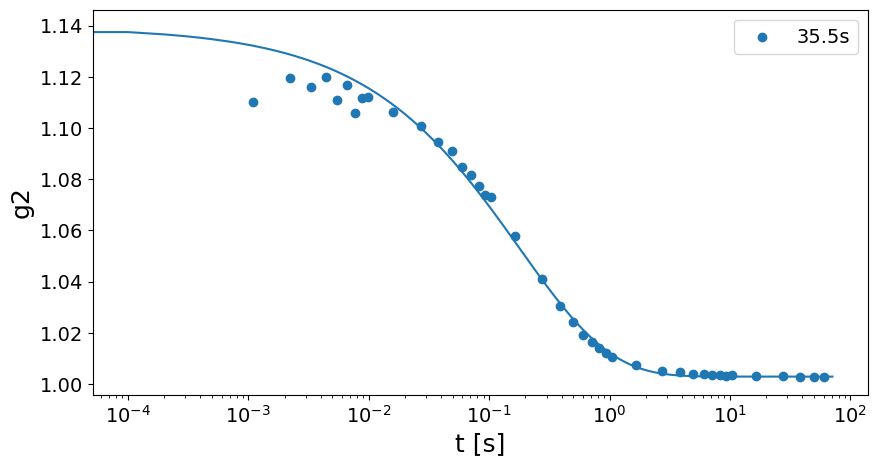

tau = 0.17838447051158843 +/- 0.011182751259103106
beta = 0.5726747063618449 +/- 0.017002902637138103
c = 0.13647525703443505 +/- 0.004078758423667794
y0 = 1.0028952443154868 +/- 4.17653261538642e-05


: 

In [ ]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 8.67 keV, T = 30C, Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_10p25, dataset 1, scan 6, fresh point, theta 0)

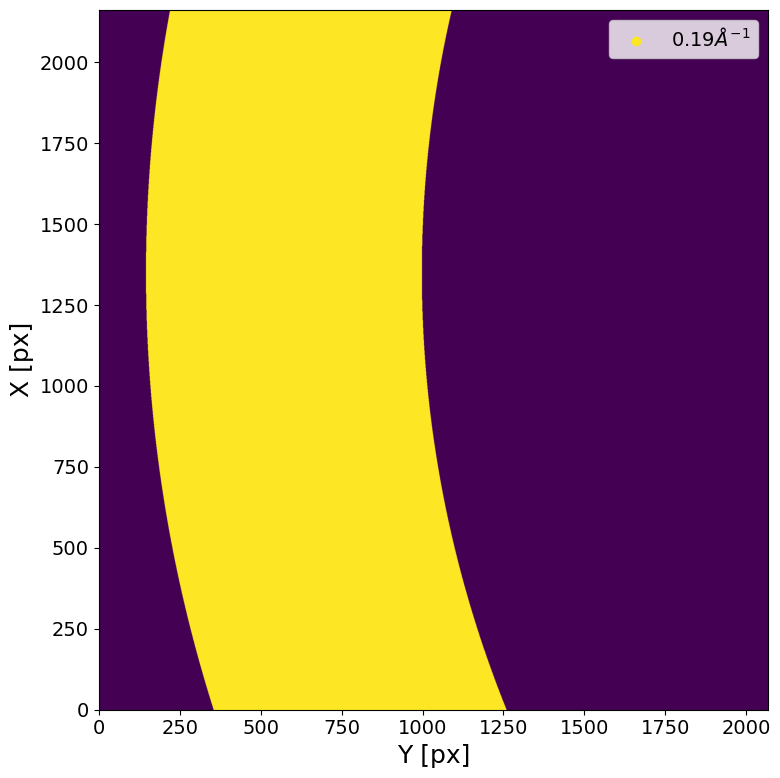

#############################
command = mtimescan 0.001 1 1200192
Ei = 8.669998877636312
itime = 0.0011
theta = 2.0000000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/107 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/107 loop

In [45]:
#######################################
sample_name = 'GeO2_4_8p67'
Ndataset = 1
Nscan = 6
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  7 pixels (of 4471016 => 0.0 %)
################################################################################



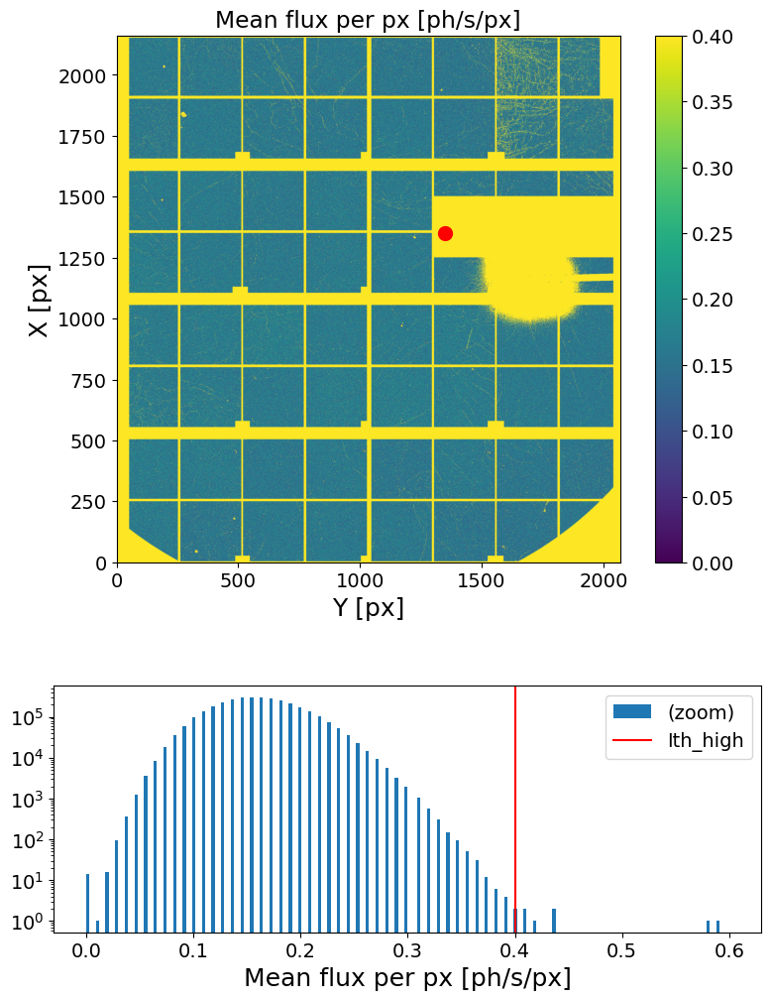

In [46]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [47]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

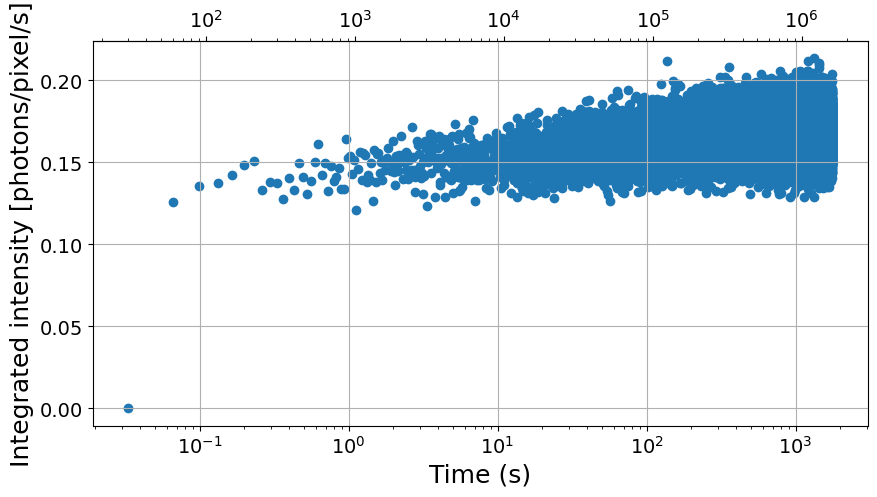

In [67]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [49]:
###################
Nfi = None
Nff = None
Lbin = 1
Nbunch = 20
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 0 , Nff = 26750 ) ...
Loading frames ...
Done! (elapsed time = 0.25 s)
	 | 26750 frames X 4471016 pixels
	 | sparsity = 1.59e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.159 GB
Masking data ...
Done! (elapsed time = 0.75 s)
	 | 26750 frames X 1588582 pixels
	 | sparsity = 1.73e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.062 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 2.29 s)
	 | 26750 X 26750 squared matrix
	 | memory usage (np.array @ float64) = 5.331 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 3.65 s)

Done!

Computing G2t for bunch 2 (Nfi = 26750 , Nff = 53500 ) ...
Loading frames ...
Done! (elapsed time = 0.25 s)
	 | 26750 frames X 4471016 pixels
	 | sparsity = 1.64e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.165 GB
Masking data ...
Done! (elapsed time = 0.81 s)
	 | 26750 frames X 1588582 pixels
	 | sparsity = 1.79e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.064 GB
Computing G2

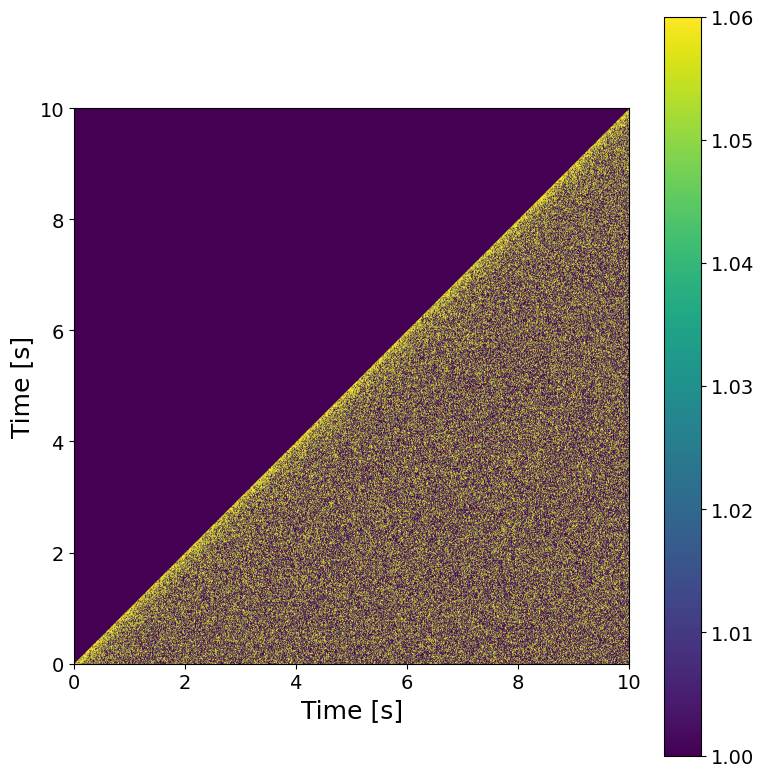

In [50]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [51]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 1.34 s)



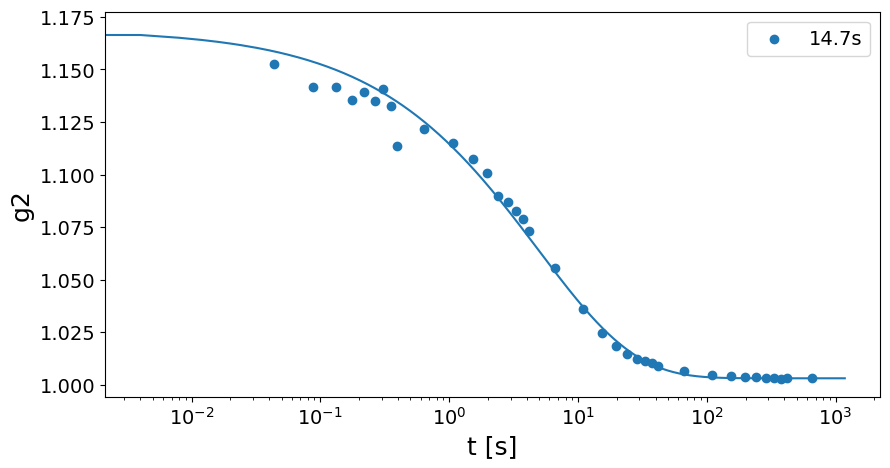

tau = 4.922399061191508 +/- 0.5418362955549918
beta = 0.5776493573314593 +/- 0.030590260509891862
c = 0.1659485575840095 +/- 0.008783144048272375
y0 = 1.0031069399747214 +/- 0.0001170281833617032


In [57]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 8.67 keV,T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_8p67, dataset 1, scan 7, fresh point, theta 0)

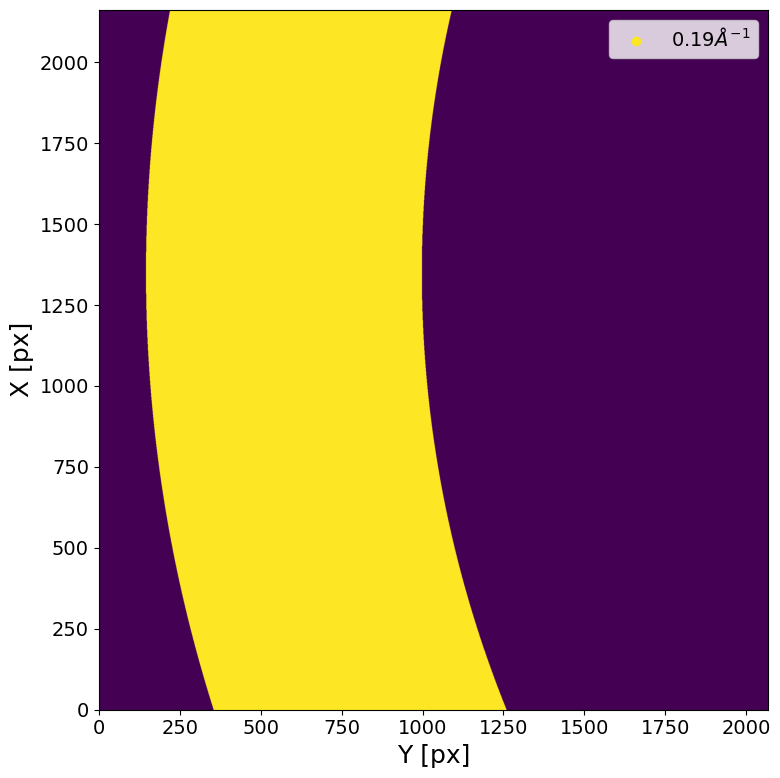

#############################
command = mtimescan 0.001 1 1200192
Ei = 8.669998877636312
itime = 0.0011
theta = 2.0000000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/103 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/103 loop

In [71]:
#######################################
sample_name = 'GeO2_4_8p67'
Ndataset = 1
Nscan = 7
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  8 pixels (of 4471016 => 0.0 %)
################################################################################



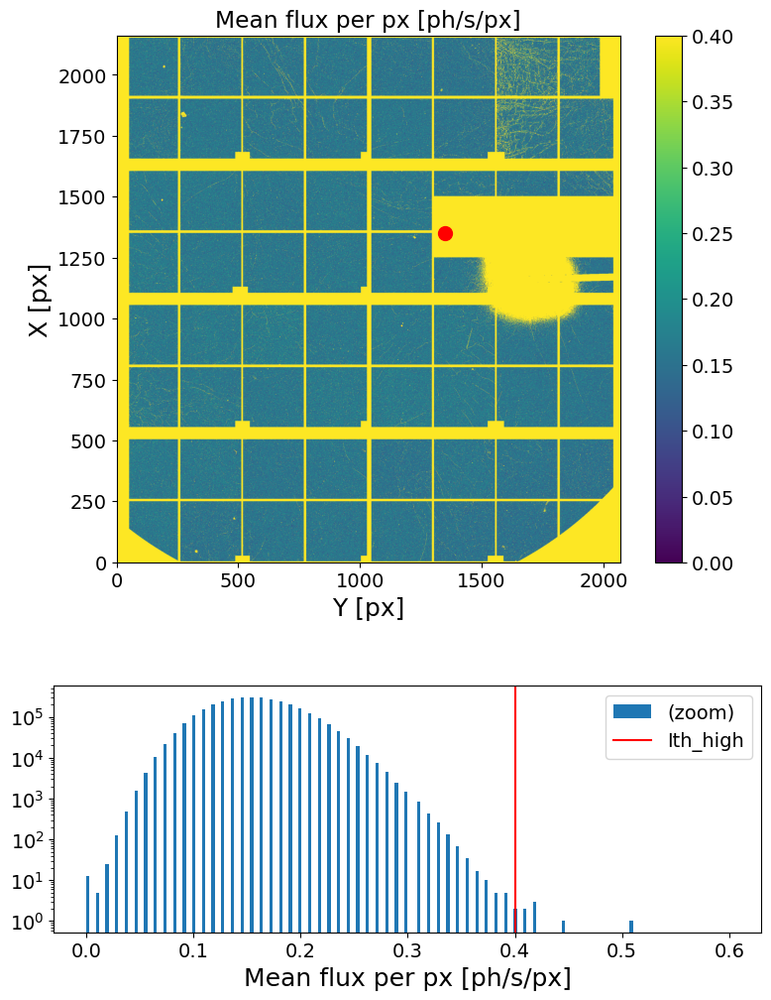

In [72]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [73]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

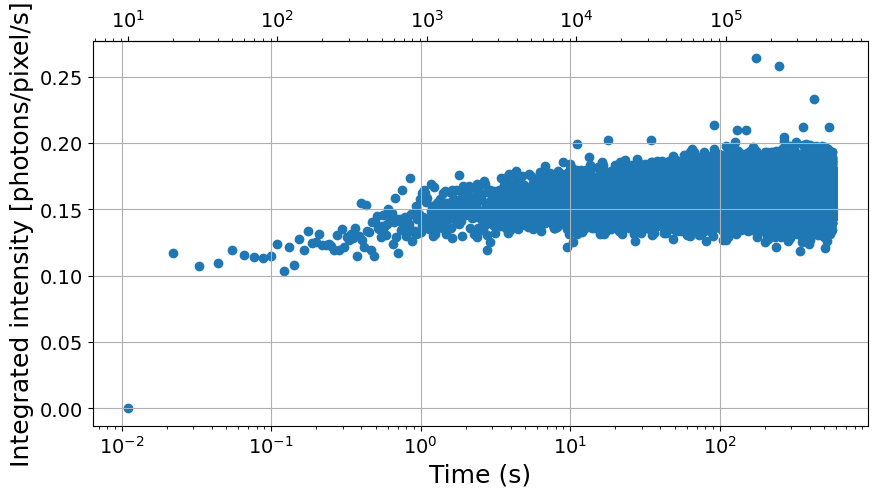

In [74]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [75]:
###################
Nfi = 1000
Nff = None
Lbin = 1
Nbunch = 20
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 1000 , Nff = 26700 ) ...
Loading frames ...
Done! (elapsed time = 0.21 s)
	 | 25700 frames X 4471016 pixels
	 | sparsity = 1.58e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.152 GB
Masking data ...
Done! (elapsed time = 0.61 s)
	 | 25700 frames X 1588582 pixels
	 | sparsity = 1.72e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.059 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 2.41 s)
	 | 25700 X 25700 squared matrix
	 | memory usage (np.array @ float64) = 4.921 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 2.45 s)

Done!

Computing G2t for bunch 2 (Nfi = 26700 , Nff = 52400 ) ...
Loading frames ...
Done! (elapsed time = 0.13 s)
	 | 25700 frames X 4471016 pixels
	 | sparsity = 1.61e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.156 GB
Masking data ...
Done! (elapsed time = 0.48 s)
	 | 25700 frames X 1588582 pixels
	 | sparsity = 1.76e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.06 GB
Computing 

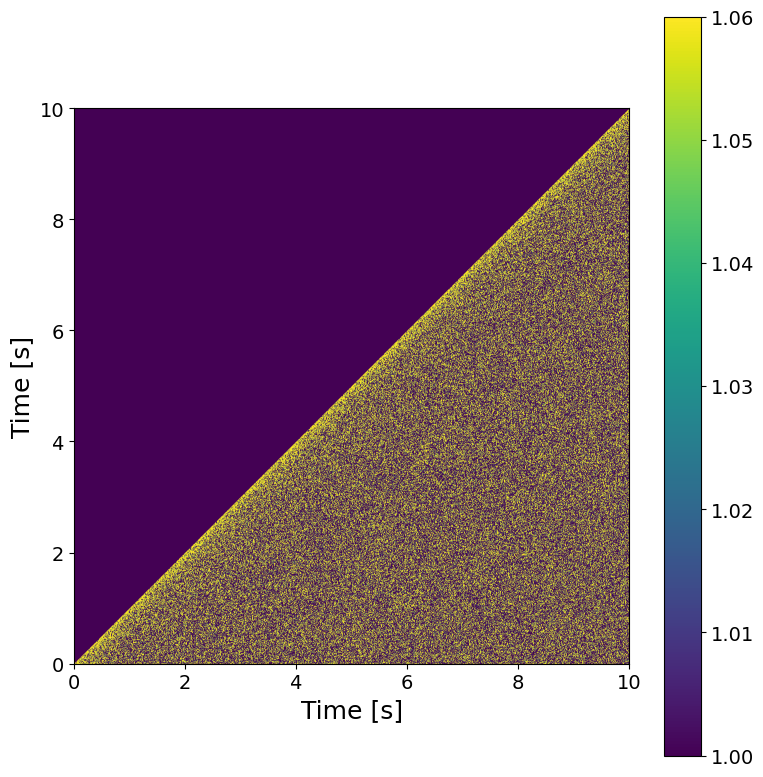

In [76]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [77]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 1.2 s)



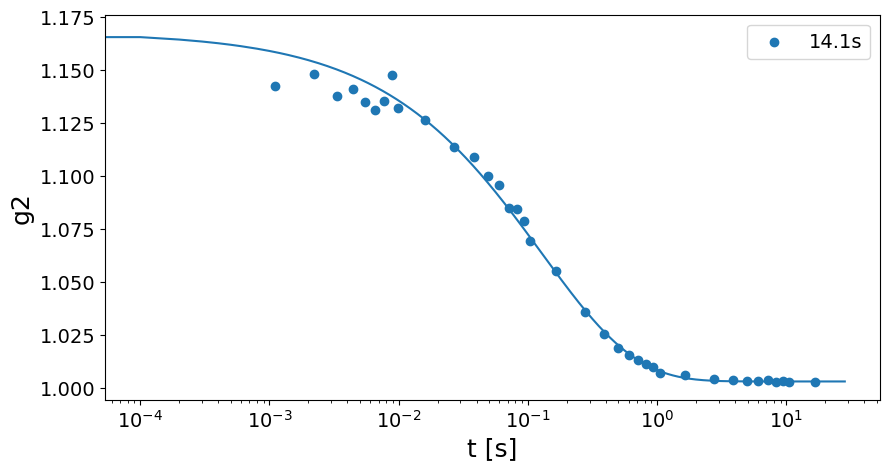

tau = 0.12746598349997929 +/- 0.013233624251894872
beta = 0.5986669732006548 +/- 0.03158429117162884
c = 0.16449428441428146 +/- 0.008410147183416346
y0 = 1.0033117477458824 +/- 0.00011902298425591906


In [78]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 8.67 keV,T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_8p67, dataset 1, scan 8, fresh point, theta 0)

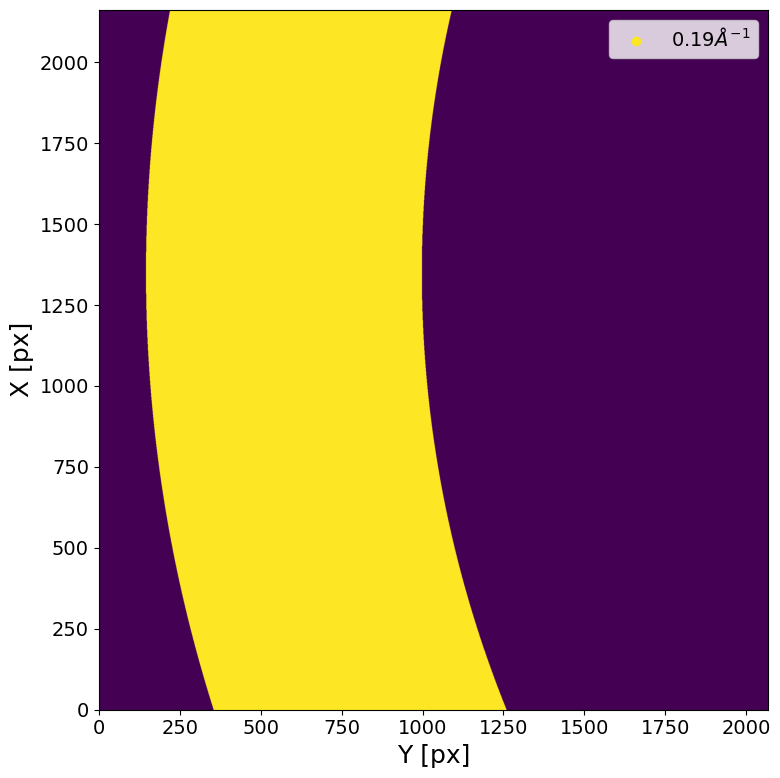

#############################
command = mtimescan 0.001 1 1200192
Ei = 8.669998877636312
itime = 0.0011
theta = 2.0000000000000004
Q = 0.15
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/241 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/241 loop

In [9]:
#######################################
sample_name = 'GeO2_4_8p67'
Ndataset = 1
Nscan = 8
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .19, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  7 pixels (of 4471016 => 0.0 %)
################################################################################



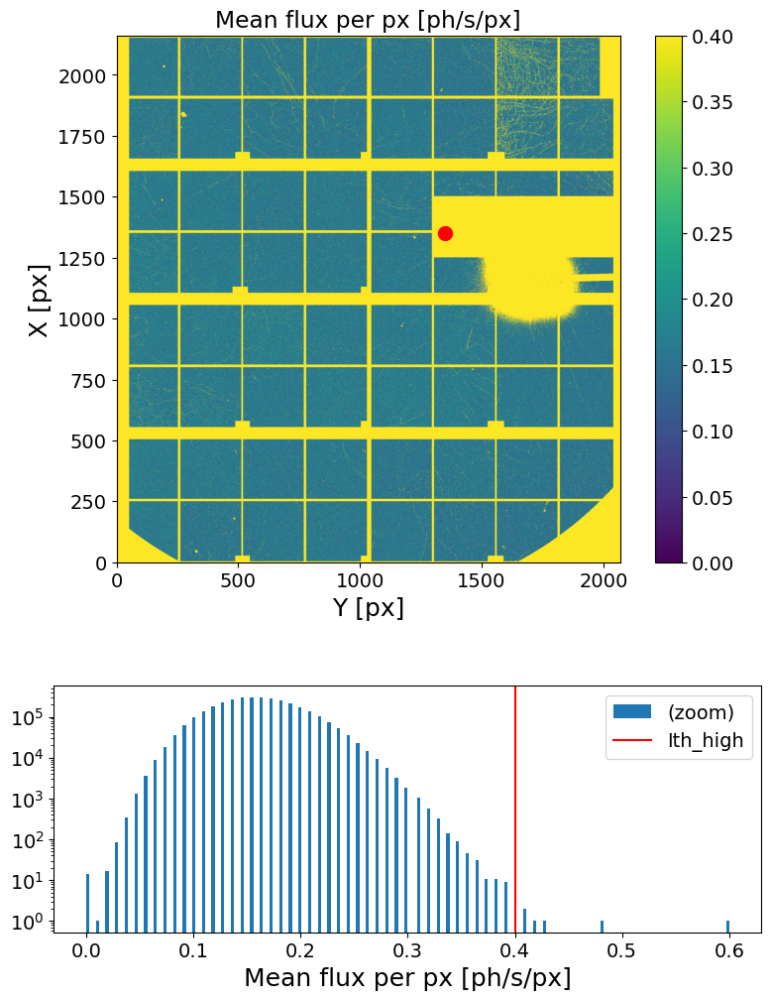

In [10]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=100_000, e4m_mask=mask)

### Intensity analysis

In [11]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

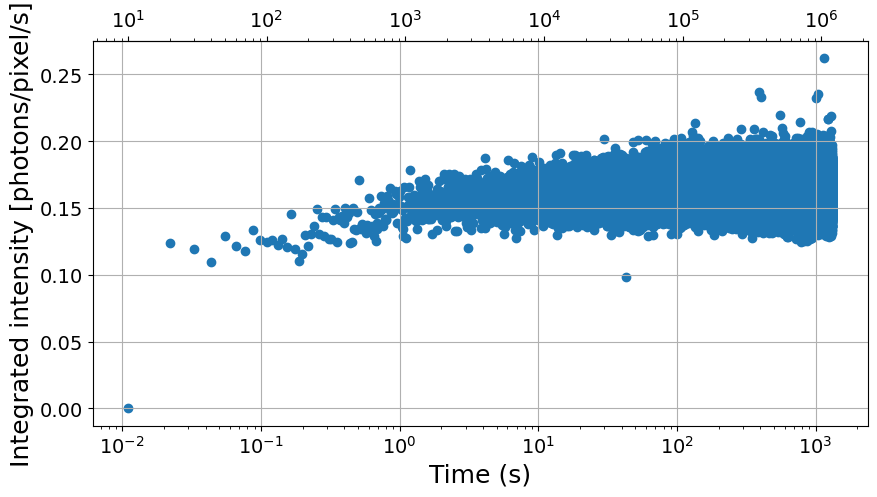

In [12]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [13]:
###################
Nfi = 1000
Nff = None
Lbin = 1
Nbunch = 30
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 1000 , Nff = 40973 ) ...
Loading frames ...
Done! (elapsed time = 0.39 s)
	 | 39973 frames X 4471016 pixels
	 | sparsity = 1.62e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.243 GB
Masking data ...
Done! (elapsed time = 1.14 s)
	 | 39973 frames X 1588582 pixels
	 | sparsity = 1.77e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.094 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 4.62 s)
	 | 39973 X 39973 squared matrix
	 | memory usage (np.array @ float64) = 11.905 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 4.0 s)

Done!

Computing G2t for bunch 2 (Nfi = 40973 , Nff = 80946 ) ...
Loading frames ...
Done! (elapsed time = 0.41 s)
	 | 39973 frames X 4471016 pixels
	 | sparsity = 1.65e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.248 GB
Masking data ...
Done! (elapsed time = 1.17 s)
	 | 39973 frames X 1588582 pixels
	 | sparsity = 1.80e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.096 GB
Computing

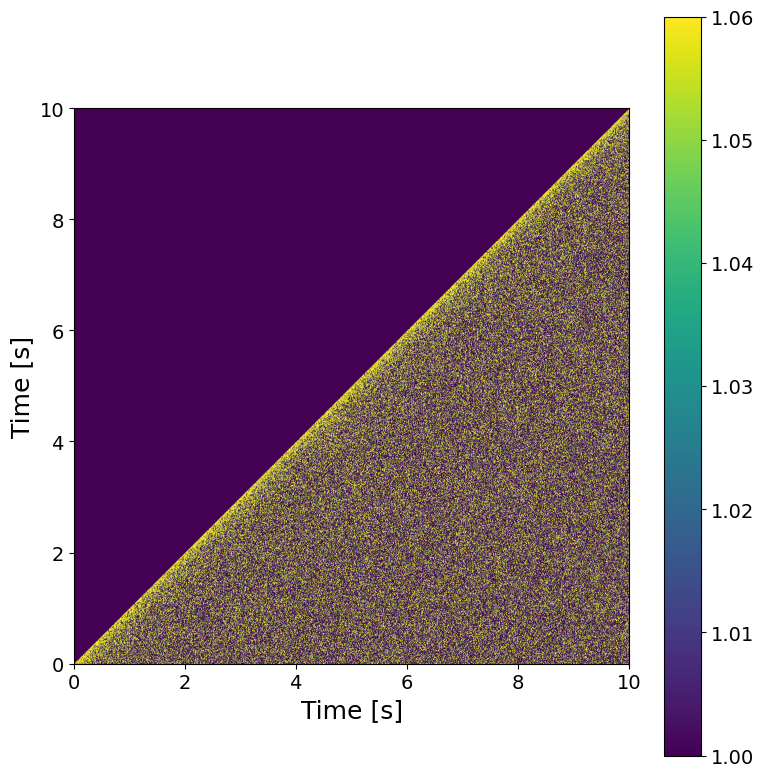

In [14]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [15]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 1.78 s)



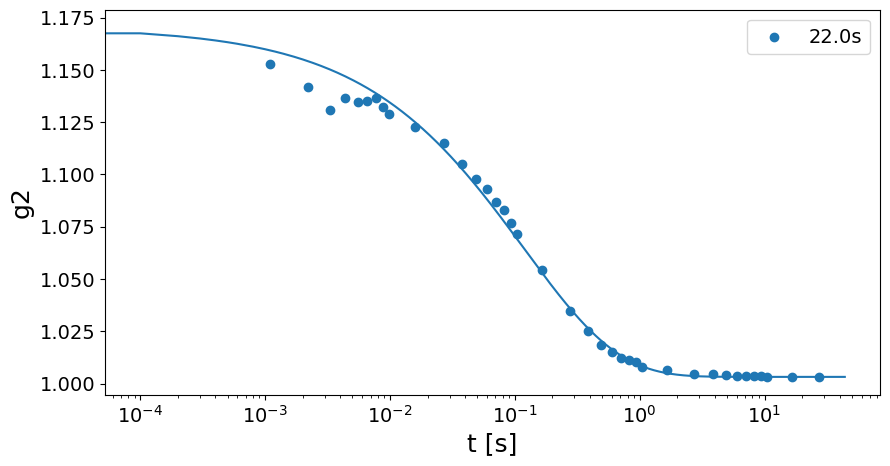

tau = 0.1181179544216423 +/- 0.01013600761897897
beta = 0.5737156732830079 +/- 0.0233358607501893
c = 0.16718157975349168 +/- 0.006859573323567063
y0 = 1.0032038825936929 +/- 7.182554082480237e-05


In [16]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[3, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  

## XPCS scan (Ei = 8.67 keV, delcoup = 5, T = 30C Q =  0.19 Å, 20 min @ 1ms (1_200_000 fm)) (GeO2_4_8p67, dataset 1, scan 8, fresh point, theta 2.7

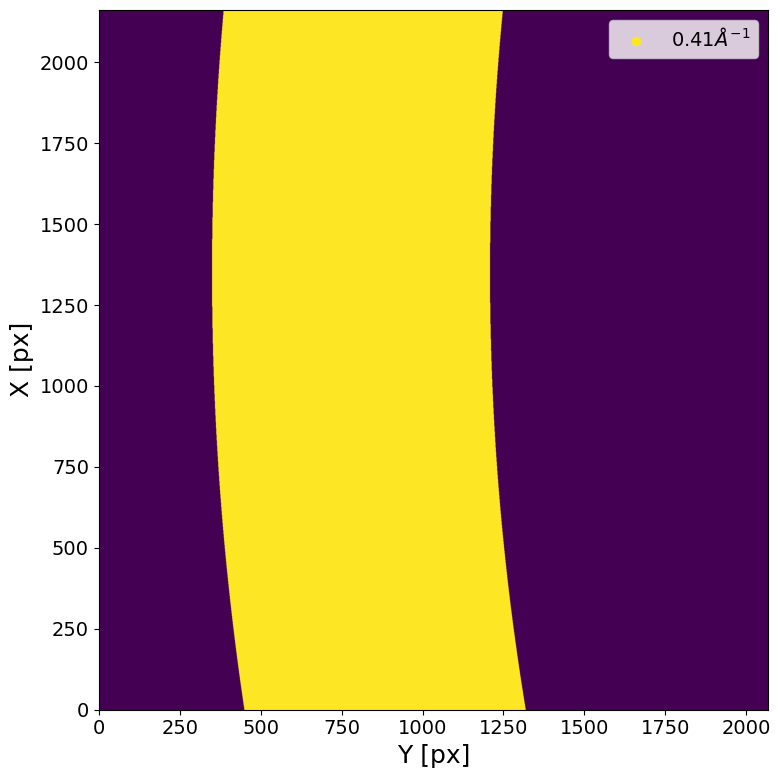

#############################
command = mtimescan 0.001 1 3599664
Ei = 8.669998877636312
itime = 0.0011
theta = 5.0
Q = 0.38
#############################

Loading sparse array ...
	 -> loading file eiger4m_v2_sparse_frame_0_00000.h5 (1/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00001.h5 (2/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00002.h5 (3/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00003.h5 (4/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00004.h5 (5/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00005.h5 (6/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00006.h5 (7/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00007.h5 (8/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00008.h5 (9/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00009.h5 (10/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00010.h5 (11/200 loops)
	 -> loading file eiger4m_v2_sparse_frame_0_00011.h5 (12/200 loops)
	 -> loading

In [149]:
#######################################
sample_name = 'GeO2_4_8p67'
Ndataset = 1
Nscan = 9
Nfi, Nff =  None, None
#######################################

scan = ID10.load_scan(raw_folder, sample_name, Ndataset, Nscan)
Ei = scan['monoe']
itime = scan['fast_timer_period'][0]
theta = scan['delcoup']
Q = round(XPCS.theta2Q(Ei,  theta),2)
Qmask = XPCS.gen_Qmask(Ei, theta, .41, .02, Qmap_plot=False)

print('#############################')
print('command =', scan['command'])
print('Ei =', Ei)
print('itime =', itime)
print('theta =', theta)
print('Q =', Q)
print('#############################\n')

e4m_data = ID10.load_sparse_e4m(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )
#e4m_data = ID10.load_dense_e4m_new(raw_folder, sample_name, Ndataset, Nscan, Nfi, Nff,  n_jobs=1, )

e4m_data = COSMIC.fast_gamma_filter(e4m_data, Imaxth_high=5)

### Flux check

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  4714 pixels (of 4471016 => 0.14 %)
################################################################################



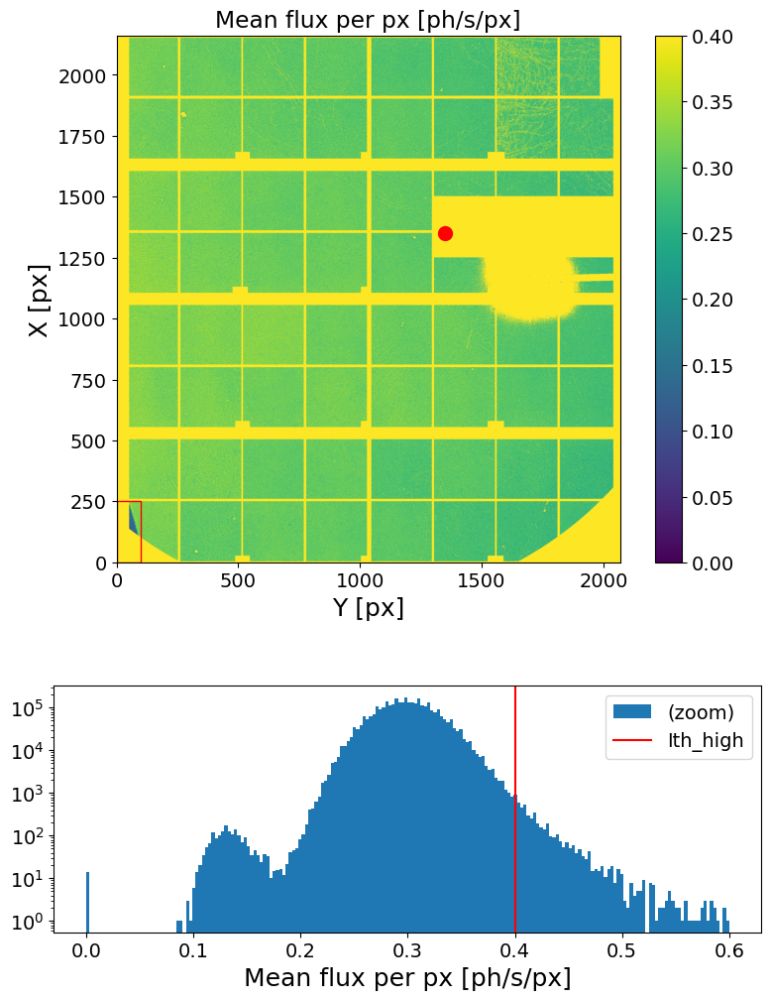

In [150]:
#############################################
mask = e4m_mask * e4m_htmask * bs_mask
#############################################

geom = [{'geom':'Rectangle', 'x0':0, 'y0':0, 'xl':250, 'yl':100, 'inside':False}]

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=None, e4m_mask=mask,mask_geom=geom)

#################################################
Masked area =  99.4329924115682 %
#################################################



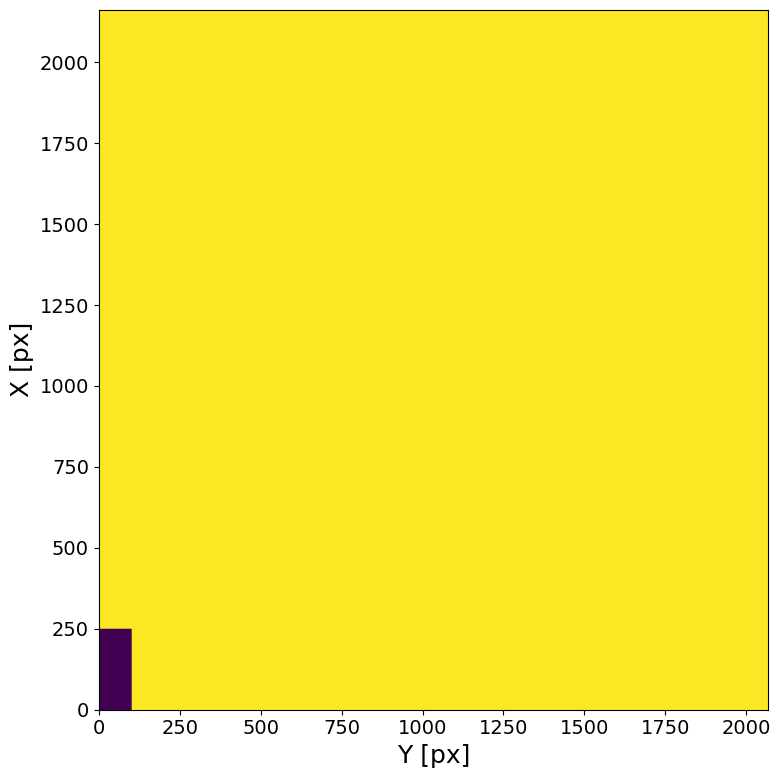

################################################################################
Maximum count in the hull run -> 5
# of pixels above Ith_high treshold ->  4688 pixels (of 4471016 => 0.14 %)
################################################################################



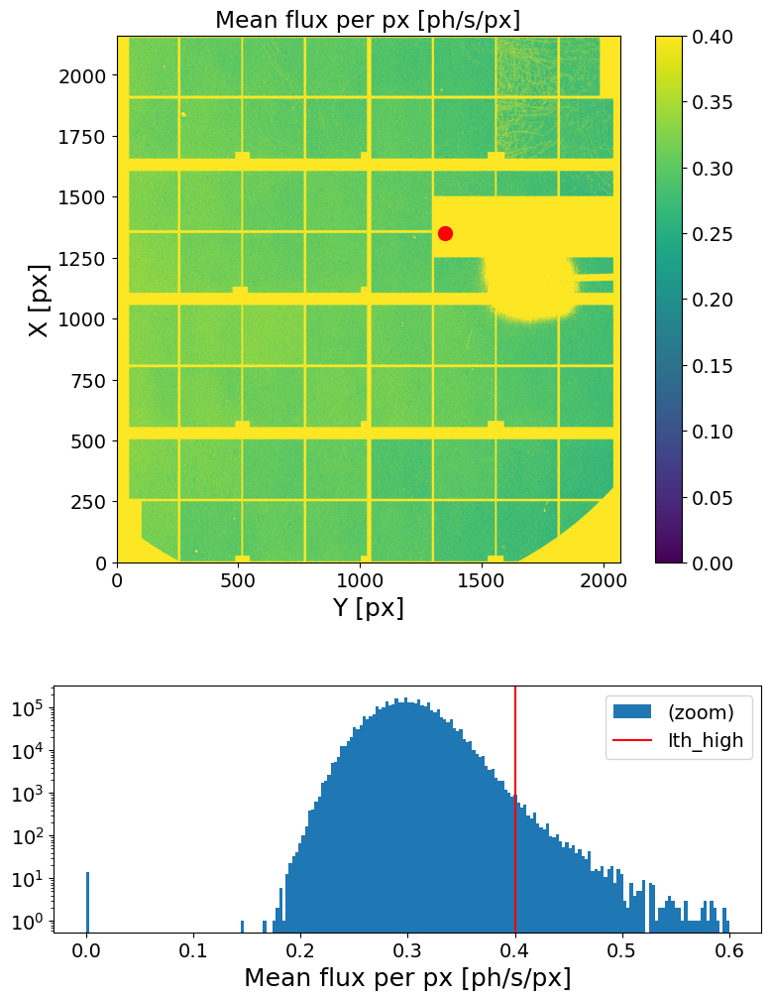

In [151]:
#############################################
delcoup5_mask = XPCS.gen_mask(e4m_data, itime, e4m_mask=None, mask_geom=geom)
mask = e4m_mask * e4m_htmask * bs_mask * delcoup5_mask
#############################################

XPCS.gen_plots4mask(e4m_data, itime, Ith_high= .4, Nff=None, e4m_mask=mask)


### Intensity analysis

In [152]:
####################
Lbin = 1
Nstep = 10
mask = e4m_mask * e4m_htmask * bs_mask * Qmask * delcoup5_mask
####################

t_It, It = XPCS.get_It(e4m_data, itime, mask=mask, Lbin=Lbin, Nstep=Nstep)
np.savez(Idts_folder+'Idt_'+sample_name+'_'+str(Ndataset).zfill(4)+'_'+str(Nscan).zfill(4), t_It=t_It, It=It)

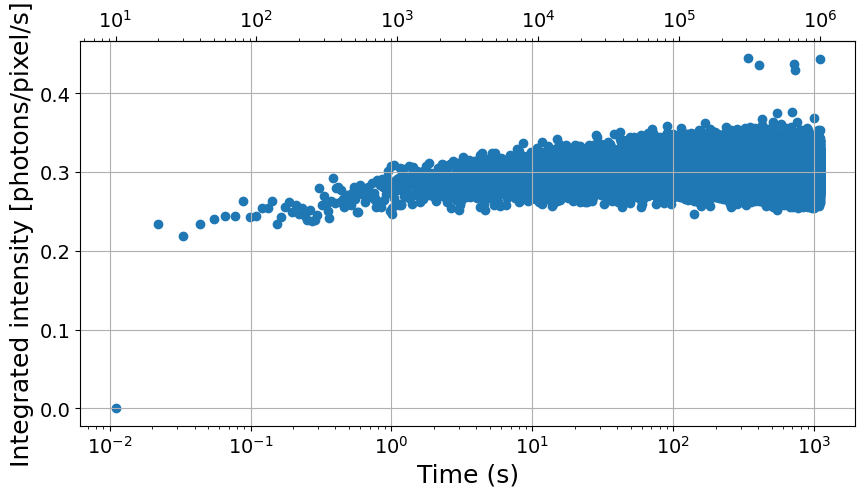

In [153]:
plt.figure(figsize=(10,5))
plt.scatter(t_It, It, label='It')

plt.xlabel('Time (s)')
plt.ylabel('Integrated intensity [photons/pixel/s]')
plt.xscale('log')
#plt.xlim(1e-2, 1)
plt.gca().secondary_xaxis('top', functions=(lambda x: x/itime, lambda x: x*itime))
plt.grid()

### Correlation

In [154]:
###################
Nfi = 10_000
Nff = None
Lbin = 1
Nbunch = 20
mask = e4m_mask * e4m_htmask * bs_mask * Qmask
###################
if Lbin is None: Lbin=1

G2t = XPCS.get_G2t_bybunch(e4m_data, mask=mask, Nfi=Nfi, Nff=Nff, Lbin=Lbin, Nbunch=Nbunch)

Computing G2t for bunch 1 (Nfi = 10000 , Nff = 59500 ) ...
Loading frames ...
Done! (elapsed time = 0.88 s)
	 | 49500 frames X 4471016 pixels
	 | sparsity = 2.99e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.554 GB
Masking data ...
Done! (elapsed time = 2.12 s)
	 | 49500 frames X 1579166 pixels
	 | sparsity = 3.31e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.217 GB
Computing G2t (using MKL library)...
Done! (elapsed time = 6.97 s)
	 | 49500 X 49500 squared matrix
	 | memory usage (np.array @ float64) = 18.256 GB
Normalizing G2t (using NumExpr library)...
Done! (elapsed time = 6.82 s)

Done!

Computing G2t for bunch 2 (Nfi = 59500 , Nff = 109000 ) ...
Loading frames ...
Done! (elapsed time = 0.43 s)
	 | 49500 frames X 4471016 pixels
	 | sparsity = 3.03e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.562 GB
Masking data ...
Done! (elapsed time = 1.63 s)
	 | 49500 frames X 1579166 pixels
	 | sparsity = 3.36e-04
	 | memory usage (sparse.csr_array @ uint8) = 0.22 GB
Computi

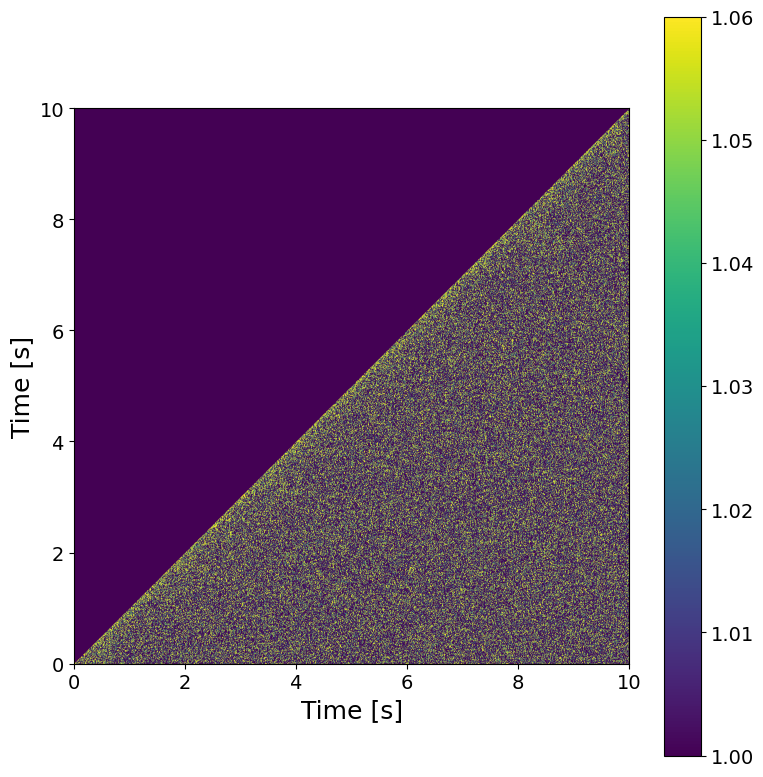

In [155]:
############################
t1, t2 = 0, 10
vmin, vmax = 1.0, 1.06
############################
XPCS.plot_G2t(G2t, vmin, vmax, itime=itime, t1=t1, t2=t2, sigma_filter=3)

In [156]:
################
Nbunch = 1
################

NfXbunch = int(G2t.shape[0]/Nbunch)
t, g2, t_mt, g2_mt = {}, {}, {}, {}
for n in range(Nbunch):
    t_bunch = round(itime*Lbin*NfXbunch*(n+1/2),1)

    t[t_bunch], g2[t_bunch] = XPCS.get_g2(itime*Lbin, np.array(G2t[NfXbunch*n:NfXbunch*(n+1), NfXbunch*n:NfXbunch*(n+1)]), cython=False)
    t_mt[t_bunch], g2_mt[t_bunch] = XPCS.get_g2_mt(itime*Lbin, g2[t_bunch])    


Computing g2...
Done! (elapsed time = 3.12 s)



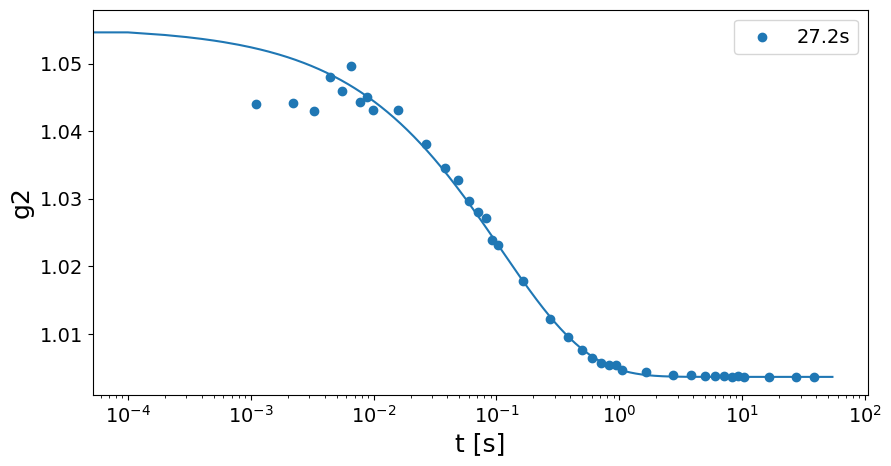

tau = 0.10768130153784902 +/- 0.01741708963432917
beta = 0.6057207642957846 +/- 0.050308960776677625
c = 0.0517314310547833 +/- 0.004148254931593654
y0 = 1.0036464216117935 +/- 3.808654086703779e-05


In [157]:
##################
t1_fit = 0
t2_fit = 1e8
##################
 
plt.figure(figsize=(10,5))
fit_out = pd.DataFrame(columns=['tau', 'beta', 'c', 'y0', 'dtau', 'dbeta', 'dc', 'dy0'])
fit_out.index.name = 't'
for k in g2.keys():
    #plt.scatter(t[k], g2[k], s=1, label = str(k)+'s')
    plt.scatter(t_mt[k], g2_mt[k], label=str(k)+'s')

    popt, pcov = curve_fit(decorelation_f, t[k][(t1_fit<t[k])*(t[k]<t2_fit)], g2[k][(t1_fit<t[k])*(t[k]<t2_fit)], p0=[.1, .7, .02, 1], bounds=([0, 0, 0, 0], [np.inf, np.inf, np.inf, np.inf]))
    fit_out.loc[k] = [popt[0], popt[1], popt[2], popt[3], np.sqrt(pcov[0,0]), np.sqrt(pcov[1,1]), np.sqrt(pcov[2,2]), np.sqrt(pcov[3,3])]
    
    x = np.arange(np.min(t[k]), np.max(t[k]), 1e-4)
    y = decorelation_f(x, *popt)
    plt.plot(x, y,)

plt.xlabel('t [s]')
plt.ylabel('g2')
plt.xscale('log')
plt.legend()
plt.show()

if Nbunch == 1:
    print(f'tau = {popt[0]} +/- {np.sqrt(pcov[0,0])}')
    print(f'beta = {popt[1]} +/- {np.sqrt(pcov[1,1])}')
    print(f'c = {popt[2]} +/- {np.sqrt(pcov[2,2])}')
    print(f'y0 = {popt[3]} +/- {np.sqrt(pcov[3,3])}')
else:
    plt.figure(figsize=(10,5))
    plt.title('tau')
    plt.errorbar(fit_out.index, fit_out.tau,  yerr=fit_out.dtau, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('tau [s]')
    #plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('beta')
    plt.errorbar(fit_out.index, fit_out.beta,  yerr=fit_out.dbeta, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('beta')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('c')
    plt.errorbar(fit_out.index, fit_out.c,  yerr=fit_out.dc, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('c')
    plt.xlim(0)
    plt.show()

    plt.figure(figsize=(10,5))
    plt.title('y0')
    plt.errorbar(fit_out.index, fit_out.y0,  yerr=fit_out.dy0, fmt='o')
    plt.xlabel('t [s]')
    plt.ylabel('y0')
    plt.show()  